# The task statement

##### The task is to group the houses in California into a prestige groups according to their location, housing age, value and ocean proximity

# Libraries

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 50)
pd.set_option('display.max_columns', 30)
import matplotlib.pyplot as plt
import seaborn as sb
import missingno as msno
import random as rd

In [2]:
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.cluster import KMeans, DBSCAN
#from sklearn.cluster import MiniBatchKMeans, MeanShift, AgglomerativeClustering, Birch
#from sklearn.cluster import OPTICS, SpectralClustering, AffinityPropagation
from sklearn.metrics import silhouette_samples, silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [3]:
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)
warnings.filterwarnings("ignore", category = UserWarning)

# Dataset

In [4]:
dataset = pd.read_csv('_datasets/housing.csv')
dataset

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND


In [5]:
dataset.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
longitude,20640.0,-119.569704,2.003532,-124.3500,-121.8000,-118.4900,-118.01000,-114.3100
latitude,20640.0,35.631861,2.135952,32.5400,33.9300,34.2600,37.71000,41.9500
housing_median_age,20640.0,28.639486,12.585558,1.0000,18.0000,29.0000,37.00000,52.0000
total_rooms,20640.0,2635.763081,2181.615252,2.0000,1447.7500,2127.0000,3148.00000,39320.0000
total_bedrooms,20433.0,537.870553,421.385070,1.0000,296.0000,435.0000,647.00000,6445.0000
population,20640.0,1425.476744,1132.462122,3.0000,787.0000,1166.0000,1725.00000,35682.0000
households,20640.0,499.539680,382.329753,1.0000,280.0000,409.0000,605.00000,6082.0000
median_income,20640.0,3.870671,1.899822,0.4999,2.5634,3.5348,4.74325,15.0001
median_house_value,20640.0,206855.816909,115395.615874,14999.0000,119600.0000,179700.0000,264725.00000,500001.0000


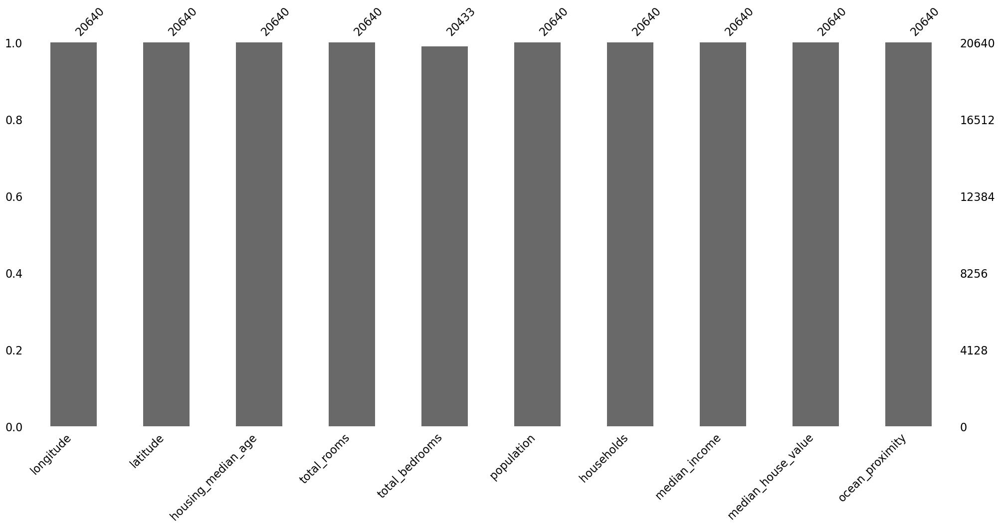

In [5]:
msno.bar(dataset)
plt.show()

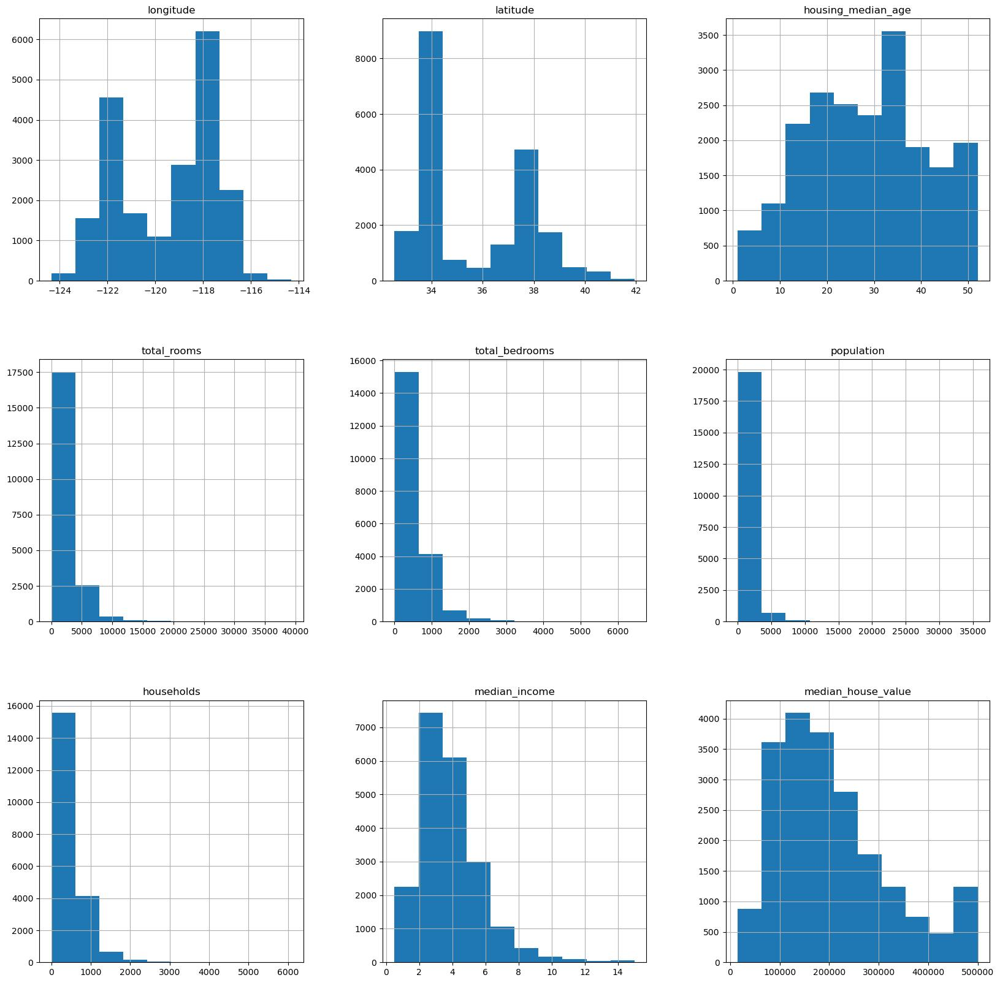

In [9]:
dataset.hist(figsize = (20, 20))
plt.show()

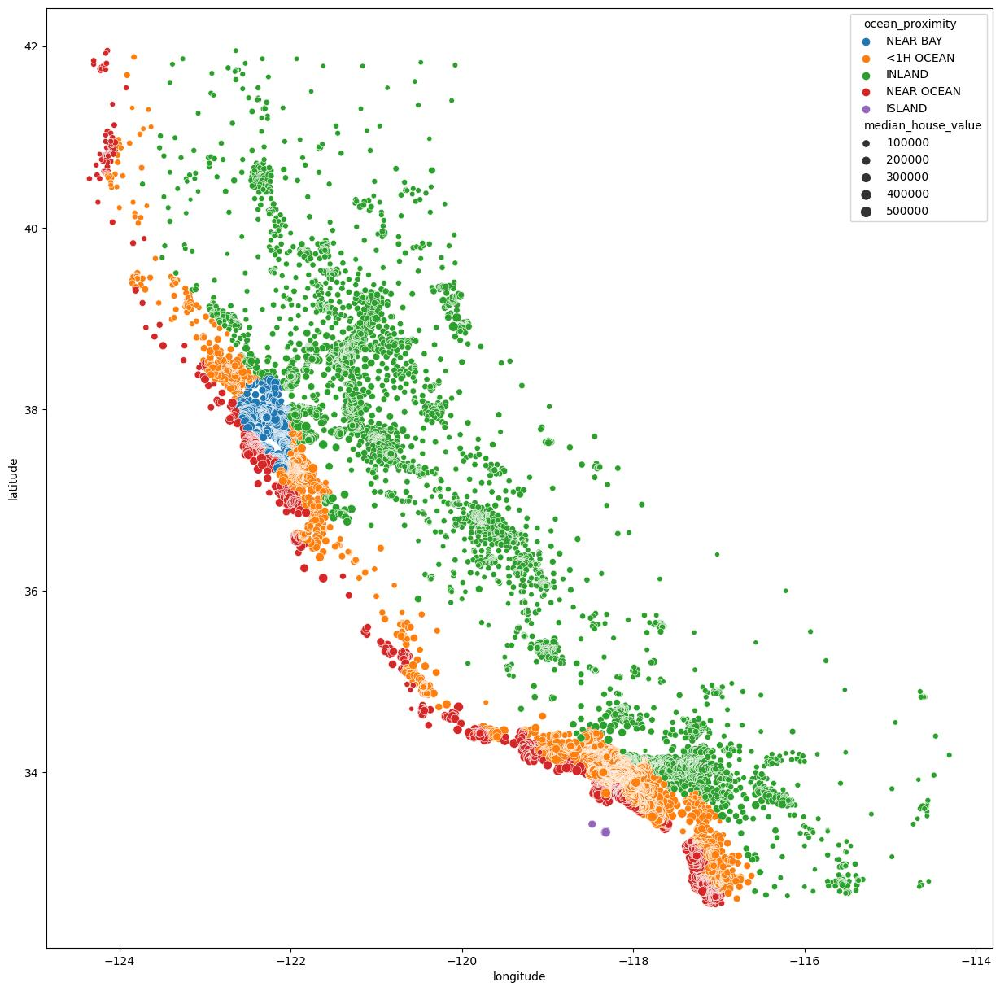

In [23]:
plt.figure(figsize = (15, 15))
sb.scatterplot(dataset, x = 'longitude', y = 'latitude', hue = 'ocean_proximity', size = 'median_house_value')
plt.show()

In [6]:
dataset.drop(inplace = True, columns = [
    'total_rooms',
    'total_bedrooms',
    'population',
    'households',
    'median_income'
])
dataset

,longitude,latitude,housing_median_age,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,452600.0,NEAR BAY
1,-122.22,37.86,21.0,358500.0,NEAR BAY
2,-122.24,37.85,52.0,352100.0,NEAR BAY
3,-122.25,37.85,52.0,341300.0,NEAR BAY
4,-122.25,37.85,52.0,342200.0,NEAR BAY
...,...,...,...,...,...
20635,-121.09,39.48,25.0,78100.0,INLAND
20636,-121.21,39.49,18.0,77100.0,INLAND
20637,-121.22,39.43,17.0,92300.0,INLAND
20638,-121.32,39.43,18.0,84700.0,INLAND


In [17]:
def dataset_lookup(df):
    print('Dataset info:')
    print(df.info())
    print()
    print('Dataset description:')
    print(df.describe())
    print()
    print('Amount of duplicates:')
    duplicates_amount = df.duplicated().sum()
    print(duplicates_amount)
    if (duplicates_amount > 0):
        print('Duplicates:')
        print(df[df.duplicated()])
    print()
    print('Amount of missing values:')
    print(df.isna().sum(axis = 0))
    print()
    print('Unique values in each column:')
    for column_name in list(df.columns.values):
        print(column_name)
        print(df[column_name].unique())
        print('------')

dataset_lookup(dataset)

Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   median_house_value  20640 non-null  float64
 4   ocean_proximity     20640 non-null  object 
dtypes: float64(4), object(1)
memory usage: 806.4+ KB
None

Dataset description:
          longitude      latitude  housing_median_age  median_house_value
count  20640.000000  20640.000000        20640.000000        20640.000000
mean    -119.569704     35.631861           28.639486       206855.816909
std        2.003532      2.135952           12.585558       115395.615874
min     -124.350000     32.540000            1.000000        14999.000000
25%     -121.800000     33.930000           18.000000       119600.000000
50%     -1

In [7]:
dataset = dataset.drop_duplicates()
dataset = dataset.reset_index().drop(columns = ['index'])
dataset

,longitude,latitude,housing_median_age,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,452600.0,NEAR BAY
1,-122.22,37.86,21.0,358500.0,NEAR BAY
2,-122.24,37.85,52.0,352100.0,NEAR BAY
3,-122.25,37.85,52.0,341300.0,NEAR BAY
4,-122.25,37.85,52.0,342200.0,NEAR BAY
...,...,...,...,...,...
20530,-121.09,39.48,25.0,78100.0,INLAND
20531,-121.21,39.49,18.0,77100.0,INLAND
20532,-121.22,39.43,17.0,92300.0,INLAND
20533,-121.32,39.43,18.0,84700.0,INLAND


In [8]:
dataset.duplicated().sum()

0

# Visual representation of the dataset

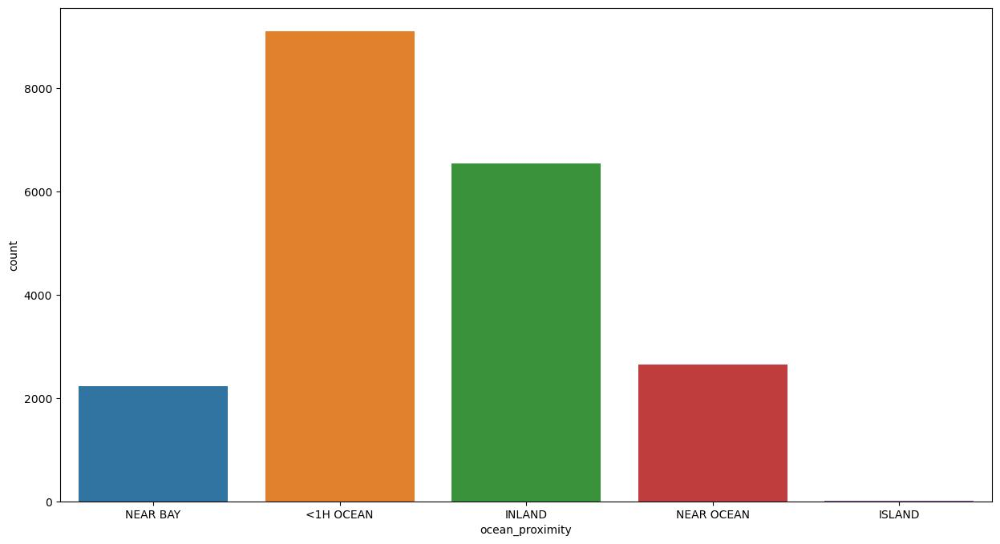

In [24]:
plt.figure(figsize = (15, 8))
sb.countplot(x = dataset['ocean_proximity'])
plt.show()

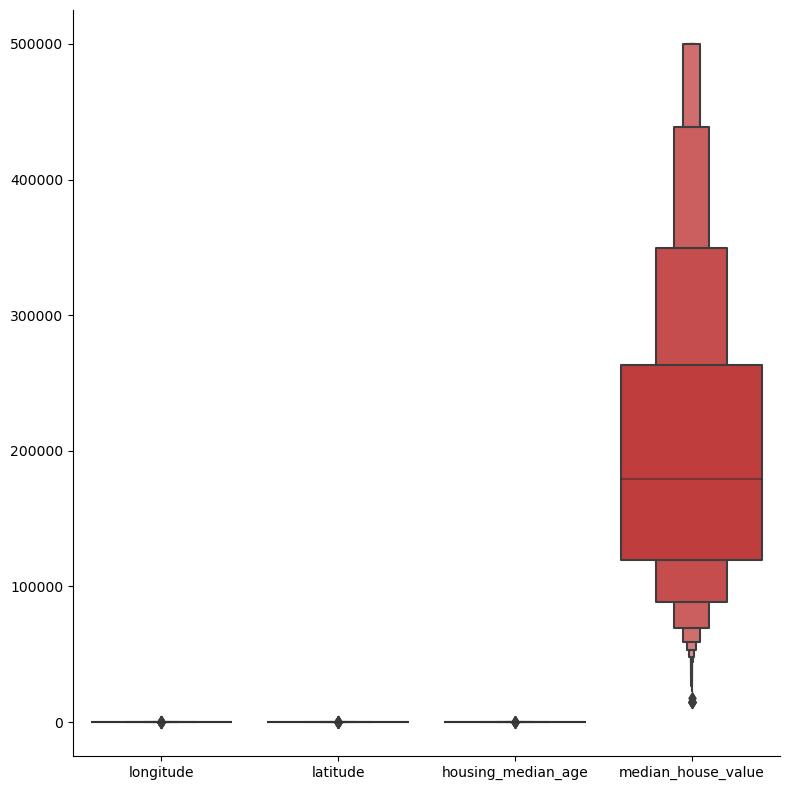

In [26]:
sb.catplot(dataset, kind = 'boxen', height = 8)
plt.show()

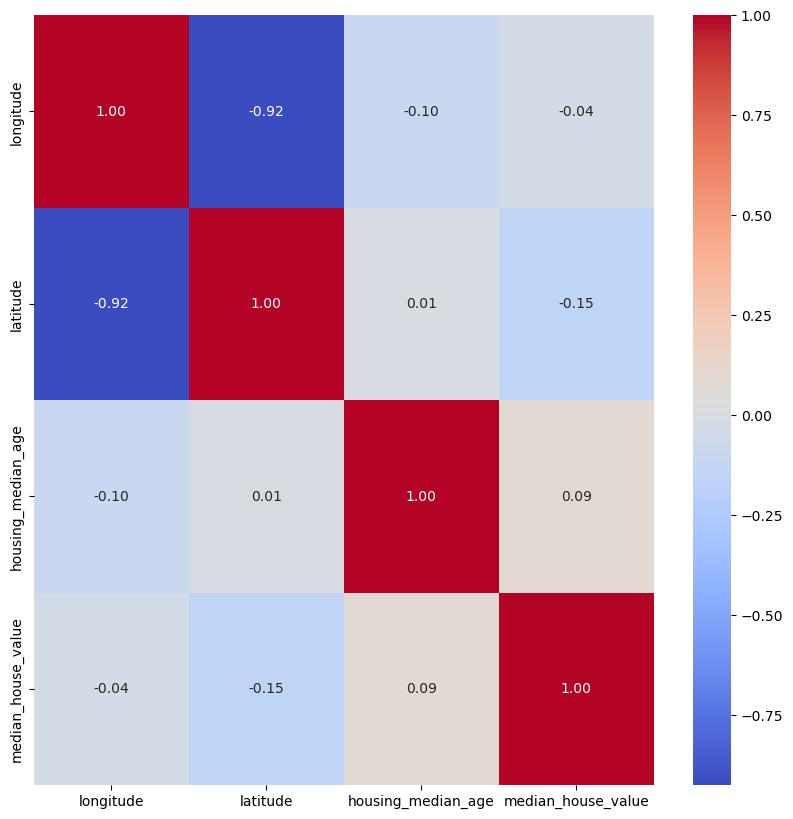

In [27]:
plt.figure(figsize = (10, 10))
sb.heatmap(dataset.drop(columns = ['ocean_proximity']).corr(), annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.show()

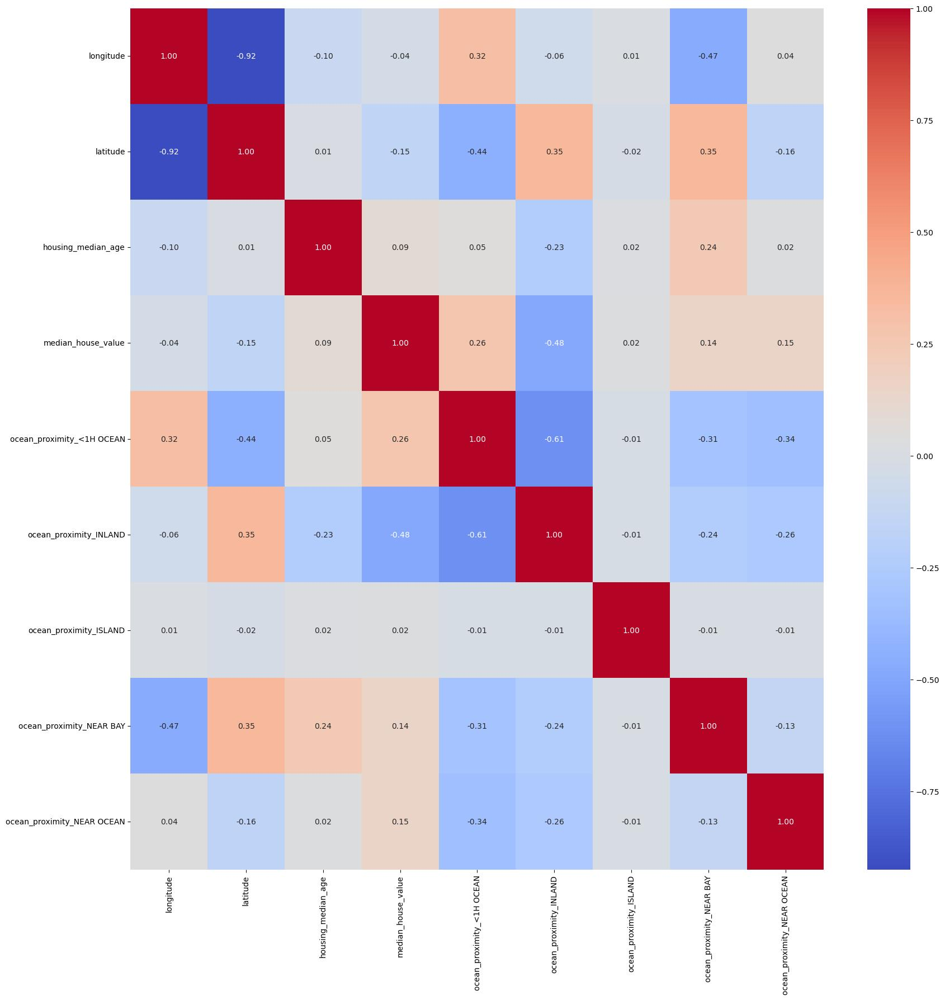

In [28]:
plt.figure(figsize = (20, 20))
sb.heatmap(pd.get_dummies(dataset, columns = ['ocean_proximity']).corr(), annot = True, cmap = 'coolwarm', fmt = '.2f')
plt.show()

<Figure size 2000x2000 with 0 Axes>

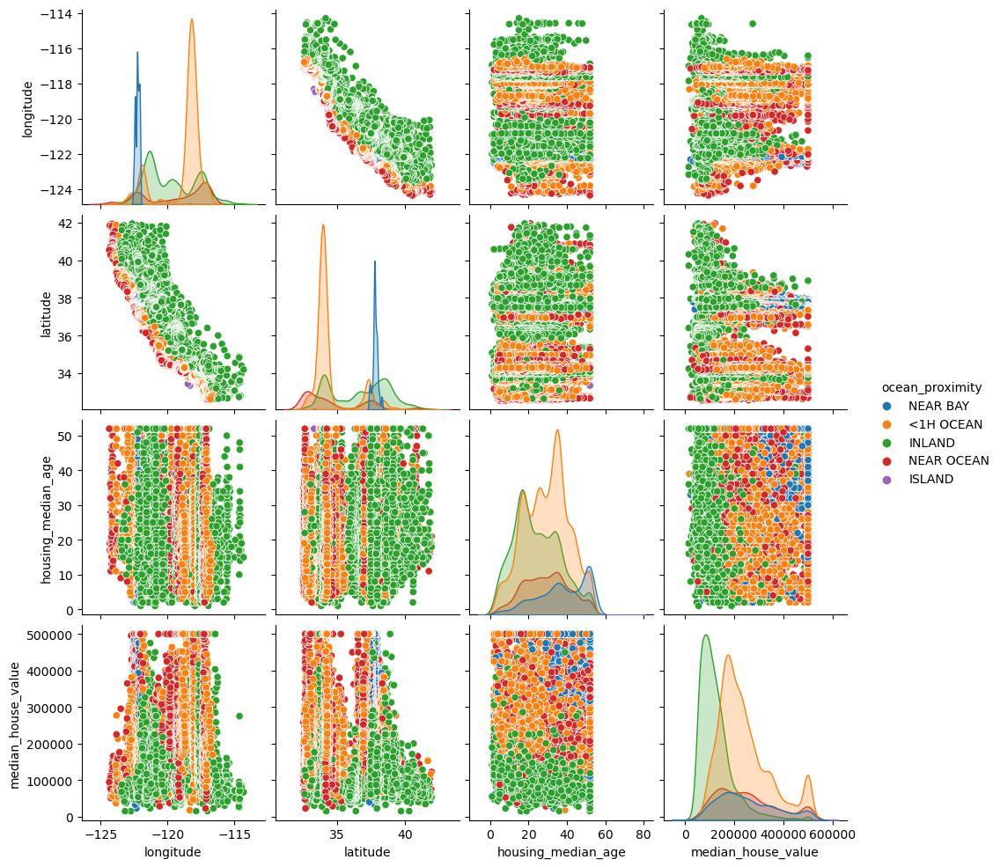

In [29]:
plt.figure(figsize = (20, 20))
sb.pairplot(dataset, palette = 'tab10', hue = 'ocean_proximity')
plt.show()

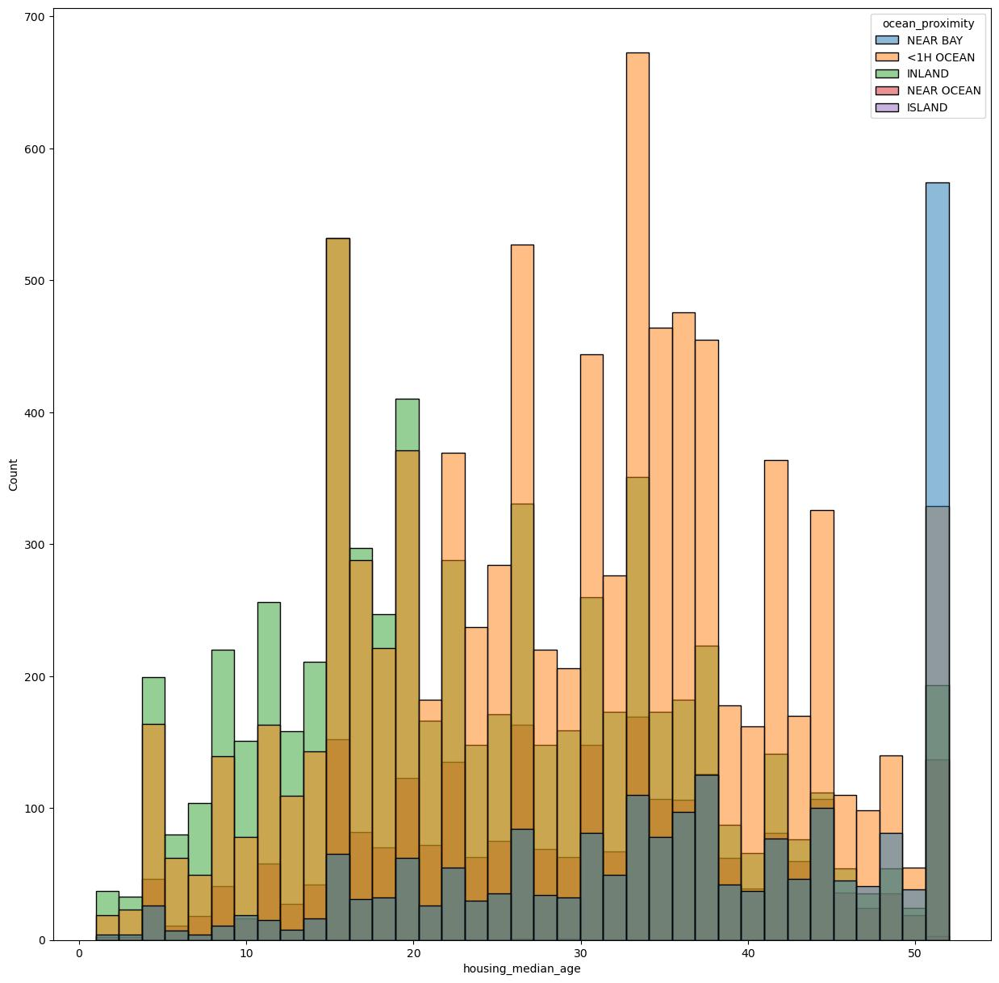

In [30]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['housing_median_age'], hue = dataset['ocean_proximity'])
plt.show()

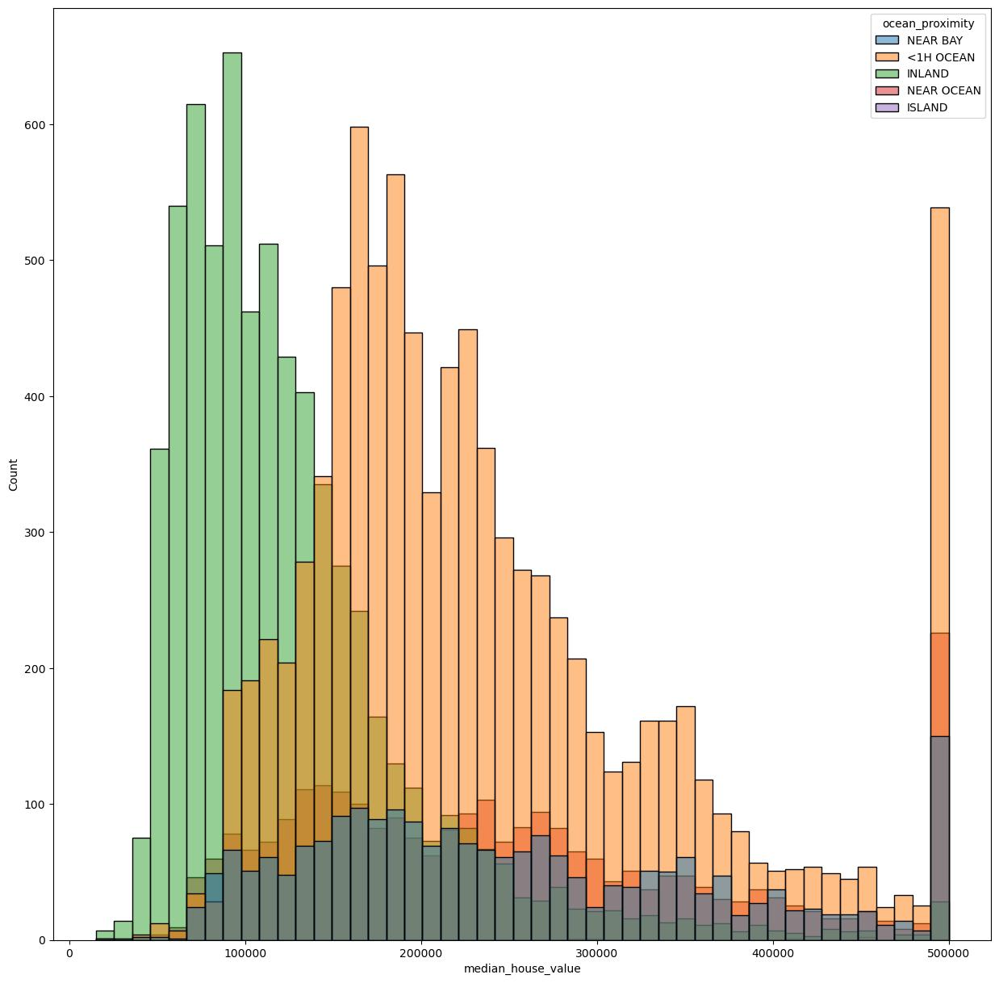

In [31]:
plt.figure(figsize = (15, 15))
sb.histplot(palette = 'tab10', data = dataset, x = dataset['median_house_value'], hue = dataset['ocean_proximity'])
plt.show()

# Standardization

In [9]:
dataset_numerical_only = dataset.drop(
    columns = [
        'ocean_proximity'
    ])
dataset_numerical_only

,longitude,latitude,housing_median_age,median_house_value
0,-122.23,37.88,41.0,452600.0
1,-122.22,37.86,21.0,358500.0
2,-122.24,37.85,52.0,352100.0
3,-122.25,37.85,52.0,341300.0
4,-122.25,37.85,52.0,342200.0
...,...,...,...,...
20530,-121.09,39.48,25.0,78100.0
20531,-121.21,39.49,18.0,77100.0
20532,-121.22,39.43,17.0,92300.0
20533,-121.32,39.43,18.0,84700.0


In [10]:
scaler = StandardScaler()
dataset_standardized = pd.DataFrame(
    scaler.fit_transform(dataset_numerical_only),
    columns = [
        'longitude',
        'latitude',
        'housing_median_age',
        'median_house_value'
    ])
dataset_standardized.insert(4, 'ocean_proximity', dataset['ocean_proximity'])
dataset_standardized

,longitude,latitude,housing_median_age,median_house_value,ocean_proximity
0,-1.333850,1.054722,0.995354,2.167202,NEAR BAY
1,-1.328852,1.045361,-0.601876,1.341776,NEAR BAY
2,-1.338849,1.040680,1.873830,1.285637,NEAR BAY
3,-1.343847,1.040680,1.873830,1.190901,NEAR BAY
4,-1.343847,1.040680,1.873830,1.198796,NEAR BAY
...,...,...,...,...,...
20530,-0.764056,1.803611,-0.282430,-1.117836,INLAND
20531,-0.824034,1.808291,-0.841460,-1.126608,INLAND
20532,-0.829032,1.780208,-0.921322,-0.993276,INLAND
20533,-0.879014,1.780208,-0.841460,-1.059942,INLAND


# Non-numeric features encoding

In [11]:
label_encoder = LabelEncoder()
dataset_encoded = dataset_standardized.copy()
dataset_encoded['ocean_proximity'] = label_encoder.fit_transform(dataset_encoded['ocean_proximity'])
dataset_encoded

,longitude,latitude,housing_median_age,median_house_value,ocean_proximity
0,-1.333850,1.054722,0.995354,2.167202,3
1,-1.328852,1.045361,-0.601876,1.341776,3
2,-1.338849,1.040680,1.873830,1.285637,3
3,-1.343847,1.040680,1.873830,1.190901,3
4,-1.343847,1.040680,1.873830,1.198796,3
...,...,...,...,...,...
20530,-0.764056,1.803611,-0.282430,-1.117836,1
20531,-0.824034,1.808291,-0.841460,-1.126608,1
20532,-0.829032,1.780208,-0.921322,-0.993276,1
20533,-0.879014,1.780208,-0.841460,-1.059942,1


# Pairplot for the processed dataset

<Figure size 2000x2000 with 0 Axes>

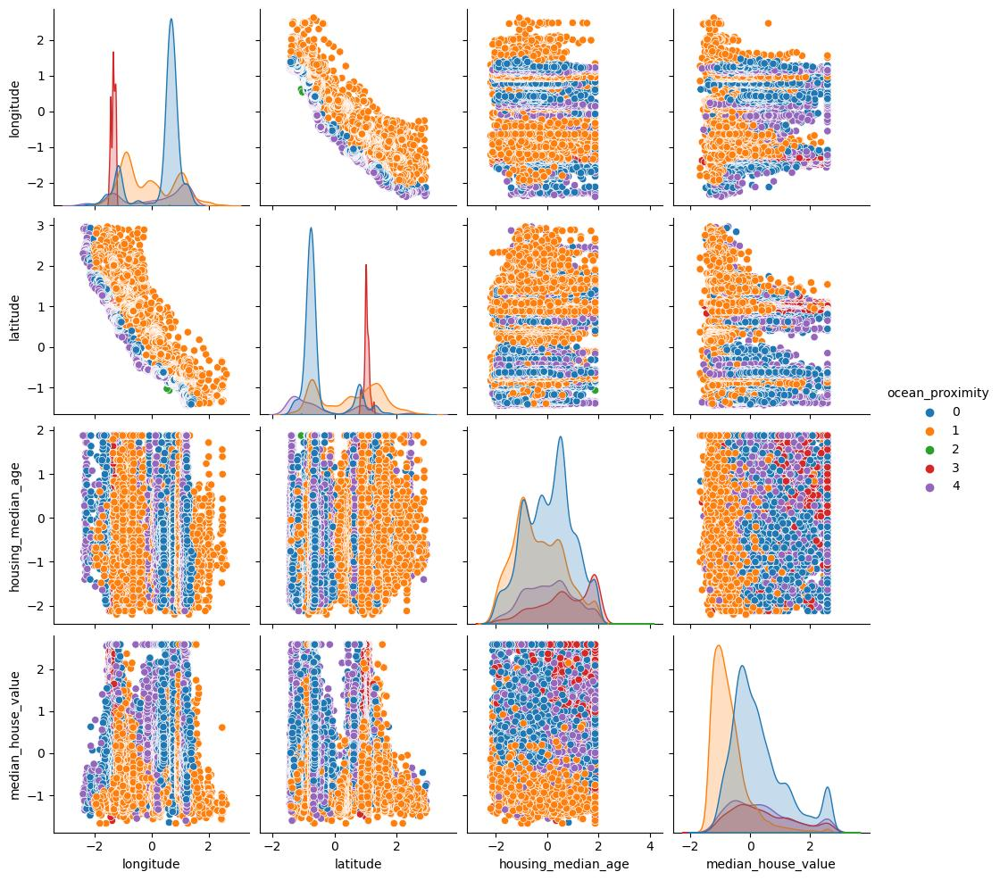

In [36]:
plt.figure(figsize = (20, 20))
sb.pairplot(dataset_encoded, palette = 'tab10', hue = 'ocean_proximity')
plt.show()

# K-Means clustering

In [12]:
dataset_clustering = dataset_encoded.copy()
dataset_clustering

,longitude,latitude,housing_median_age,median_house_value,ocean_proximity
0,-1.333850,1.054722,0.995354,2.167202,3
1,-1.328852,1.045361,-0.601876,1.341776,3
2,-1.338849,1.040680,1.873830,1.285637,3
3,-1.343847,1.040680,1.873830,1.190901,3
4,-1.343847,1.040680,1.873830,1.198796,3
...,...,...,...,...,...
20530,-0.764056,1.803611,-0.282430,-1.117836,1
20531,-0.824034,1.808291,-0.841460,-1.126608,1
20532,-0.829032,1.780208,-0.921322,-0.993276,1
20533,-0.879014,1.780208,-0.841460,-1.059942,1


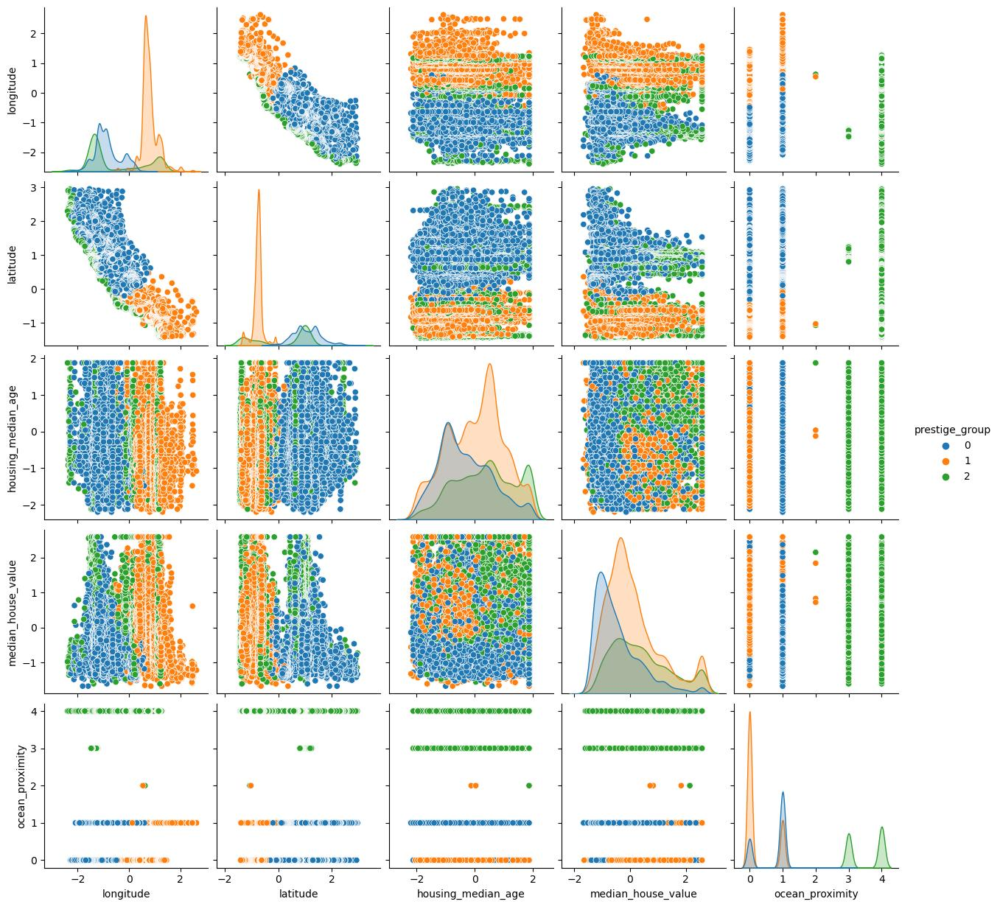

In [14]:
kmeans = KMeans(n_clusters = 3, random_state = 42)
dataset_after_clustering = dataset_clustering.copy()
dataset_after_clustering['prestige_group'] = kmeans.fit_predict(dataset_clustering.values)
sb.pairplot(dataset_after_clustering, hue = 'prestige_group', palette = 'tab10')
plt.show()

## Best clustering metric scores for K-Means

In [41]:
def print_best_coefficients(method_name, scores, find_max = True):
    sorted_scores = sorted(scores, key = lambda x: x[1], reverse = find_max)
    max_score = sorted_scores[0]
    print(f'{"Max." if find_max else "Min."} {method_name} score: {max_score[1]:.3f} (clusters: {max_score[0]})')

X = dataset_clustering.values

se = [] 
sil_scores = []
calinski_scores = []
davies_scores = []

index = range(2, 21)
for i in index:
    kmeans = KMeans(n_clusters = i, random_state = 42)
    predicted_labels = kmeans.fit_predict(X)
    print(f'Intertia at K = {i}: {kmeans.inertia_:.3f}')
    se.append(kmeans.inertia_)
    
    sil_score = silhouette_score(X, predicted_labels)
    print(f'Silhouette coefficient: {sil_score:.3f}')
    sil_scores.append((i, sil_score))
    
    calinski_score = calinski_harabasz_score(X, predicted_labels)
    print(f'Calinski-Harabasz score: {calinski_score:.3f}')
    calinski_scores.append((i, calinski_score))
    
    davies_score = davies_bouldin_score(X, predicted_labels)
    print(f'Davies-Bouldin score: {davies_score:.3f}')
    davies_scores.append((i, davies_score))
    print()

print_best_coefficients('Silhouette', sil_scores)
print_best_coefficients('Calinski-Harabasz', calinski_scores)
print_best_coefficients('Davies-Bouldin', davies_scores, False)

Intertia at K = 2: 83071.637
Silhouette coefficient: 0.394
Calinski-Harabasz score: 9988.241
Davies-Bouldin score: 1.205

Intertia at K = 3: 58279.560
Silhouette coefficient: 0.370
Calinski-Harabasz score: 11485.417
Davies-Bouldin score: 1.096

Intertia at K = 4: 46468.451
Silhouette coefficient: 0.407
Calinski-Harabasz score: 11342.167
Davies-Bouldin score: 0.997

Intertia at K = 5: 39715.803
Silhouette coefficient: 0.368
Calinski-Harabasz score: 10825.138
Davies-Bouldin score: 1.042

Intertia at K = 6: 34180.458
Silhouette coefficient: 0.359
Calinski-Harabasz score: 10726.984
Davies-Bouldin score: 0.986

Intertia at K = 7: 30806.103
Silhouette coefficient: 0.333
Calinski-Harabasz score: 10292.577
Davies-Bouldin score: 1.092

Intertia at K = 8: 28213.304
Silhouette coefficient: 0.344
Calinski-Harabasz score: 9902.009
Davies-Bouldin score: 1.024

Intertia at K = 9: 26026.474
Silhouette coefficient: 0.334
Calinski-Harabasz score: 9607.381
Davies-Bouldin score: 1.121

Intertia at K = 10:

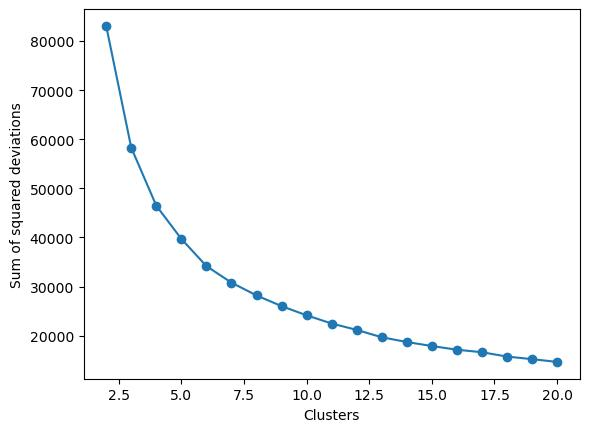

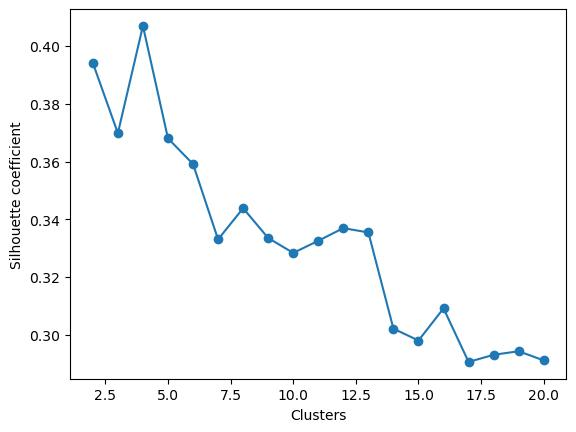

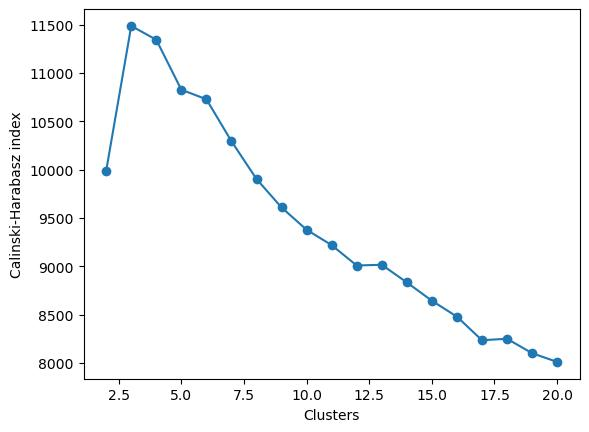

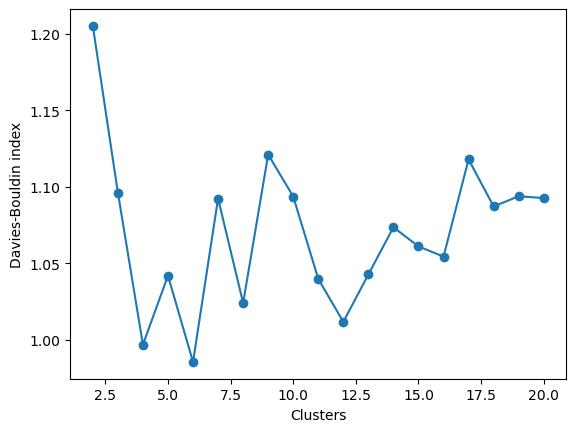

In [42]:
def plot_scores(indexes, scores, ylabel):
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Clusters')
    plt.ylabel(ylabel)
    plt.show()
    
def plot_scores_from_values(indexes, score_tuples, ylabel):
    _, scores = zip(*score_tuples)
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Clusters')
    plt.ylabel(ylabel)
    plt.show()

plot_scores(index, se, 'Sum of squared deviations')
plot_scores_from_values(index, sil_scores, 'Silhouette coefficient')
plot_scores_from_values(index, calinski_scores, 'Calinski-Harabasz index')
plot_scores_from_values(index, davies_scores, 'Davies-Bouldin index')

## Elbow rule

Amount of clusters: 2


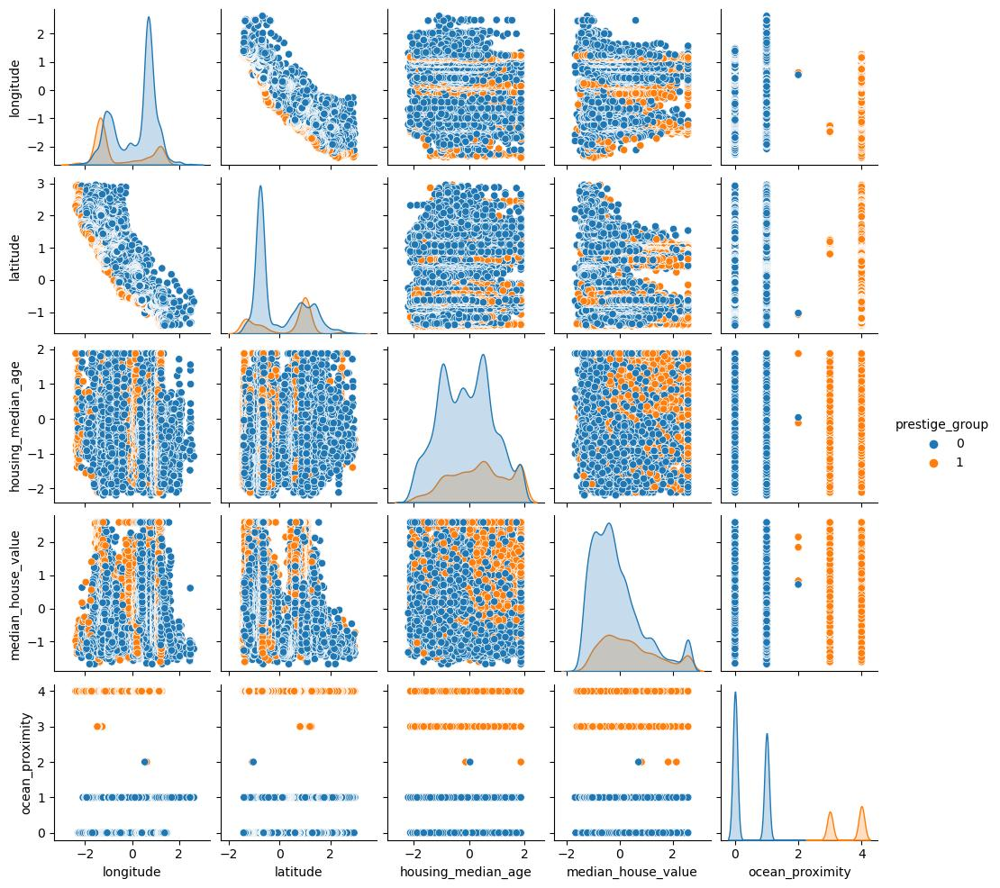

Amount of clusters: 3


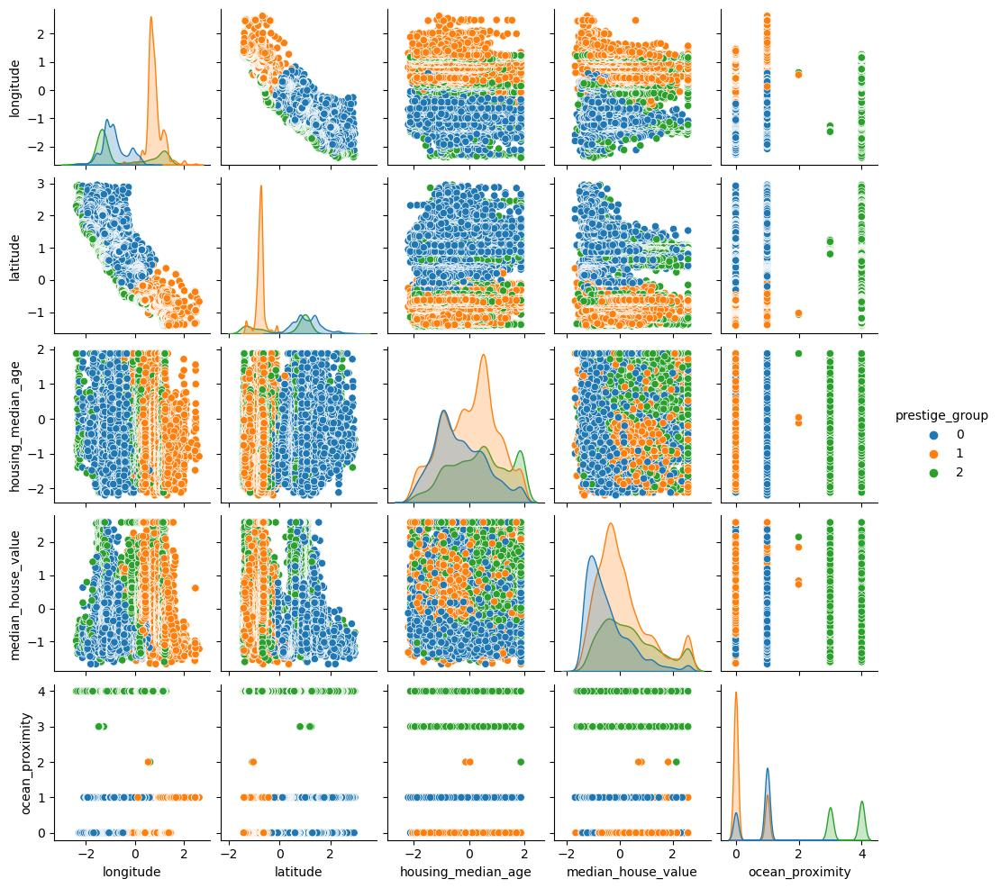

Amount of clusters: 4


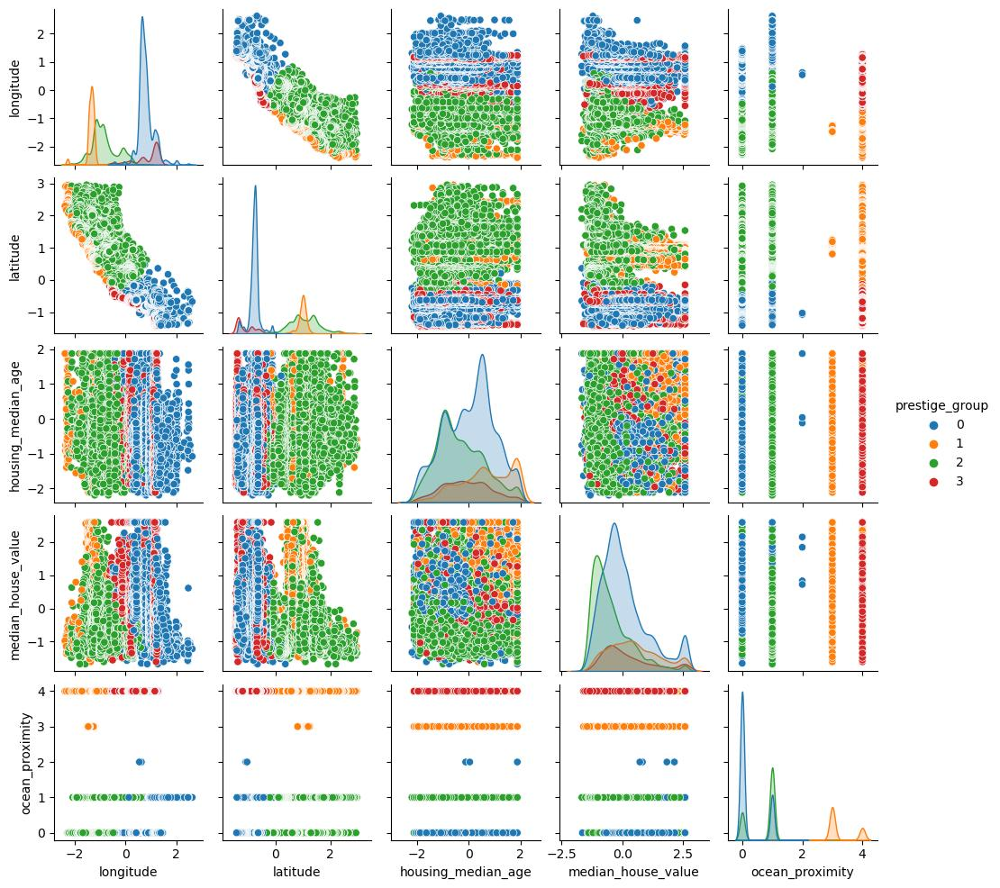

Amount of clusters: 5


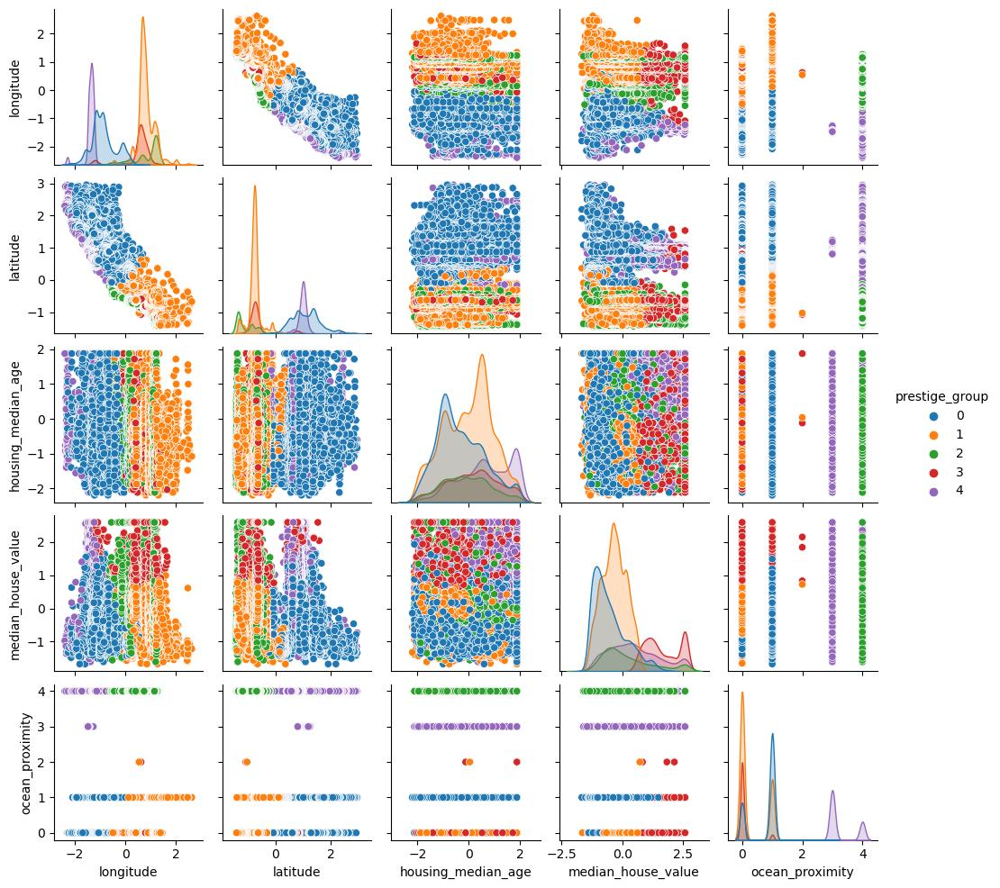

Amount of clusters: 6


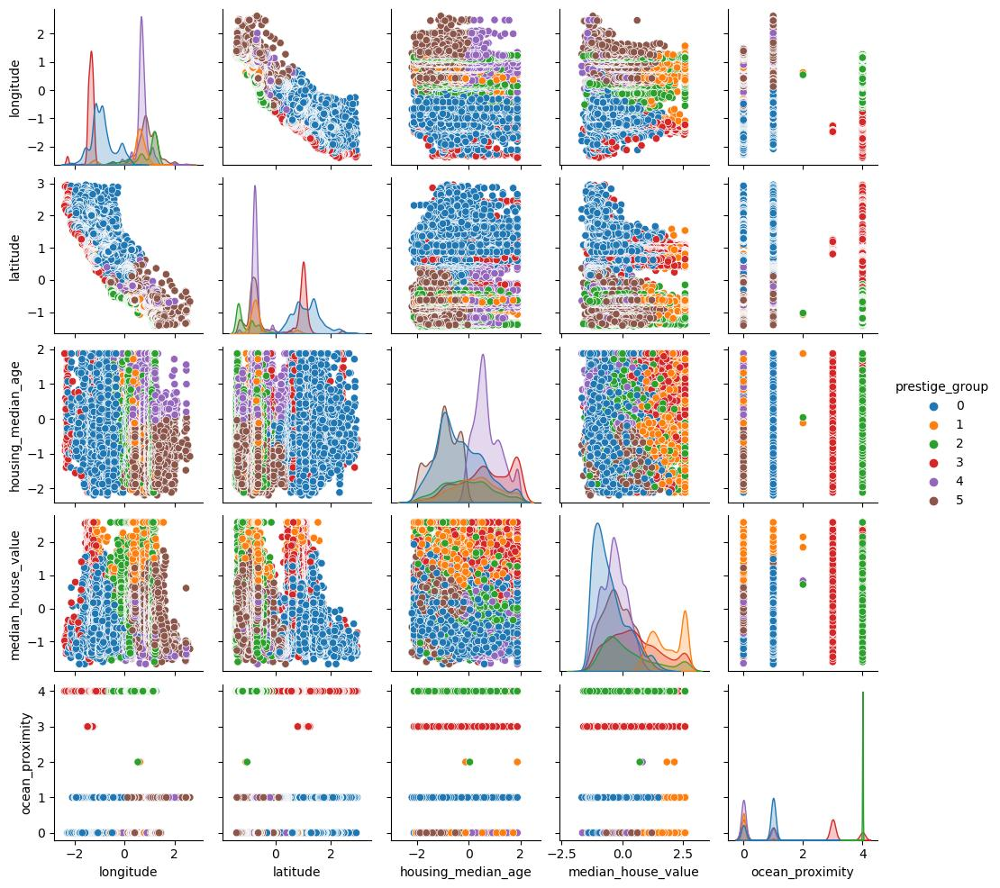

Amount of clusters: 7


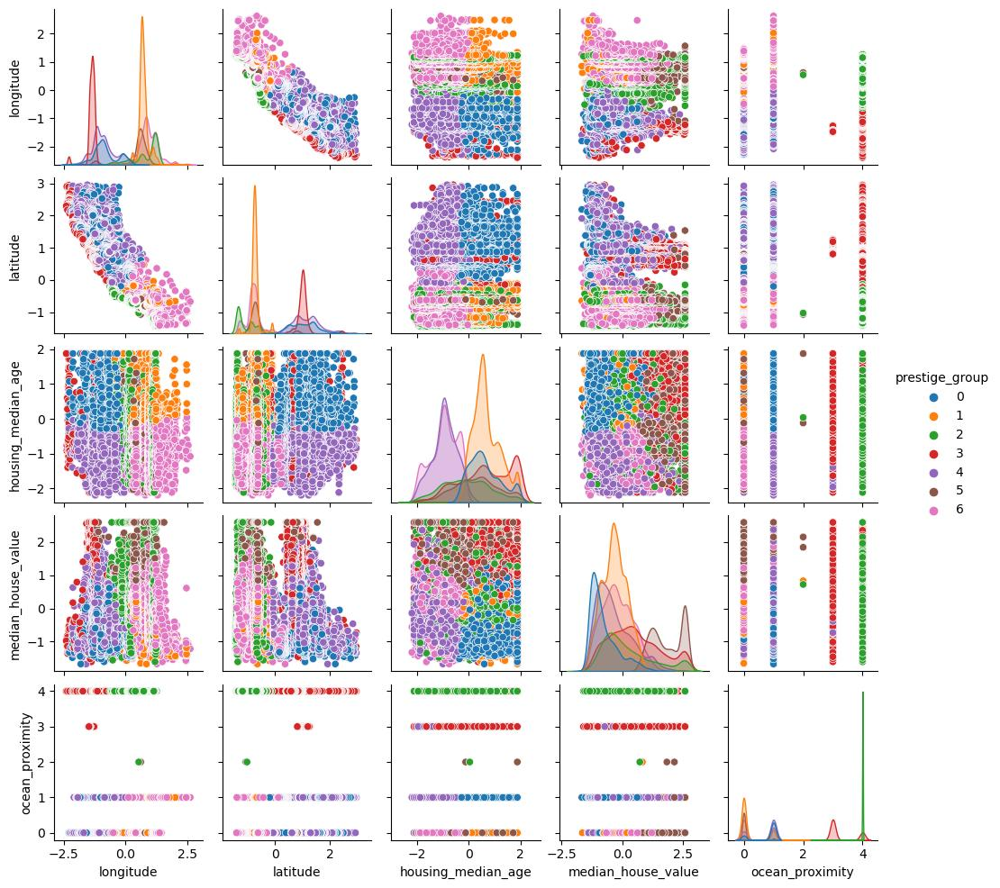

Amount of clusters: 8


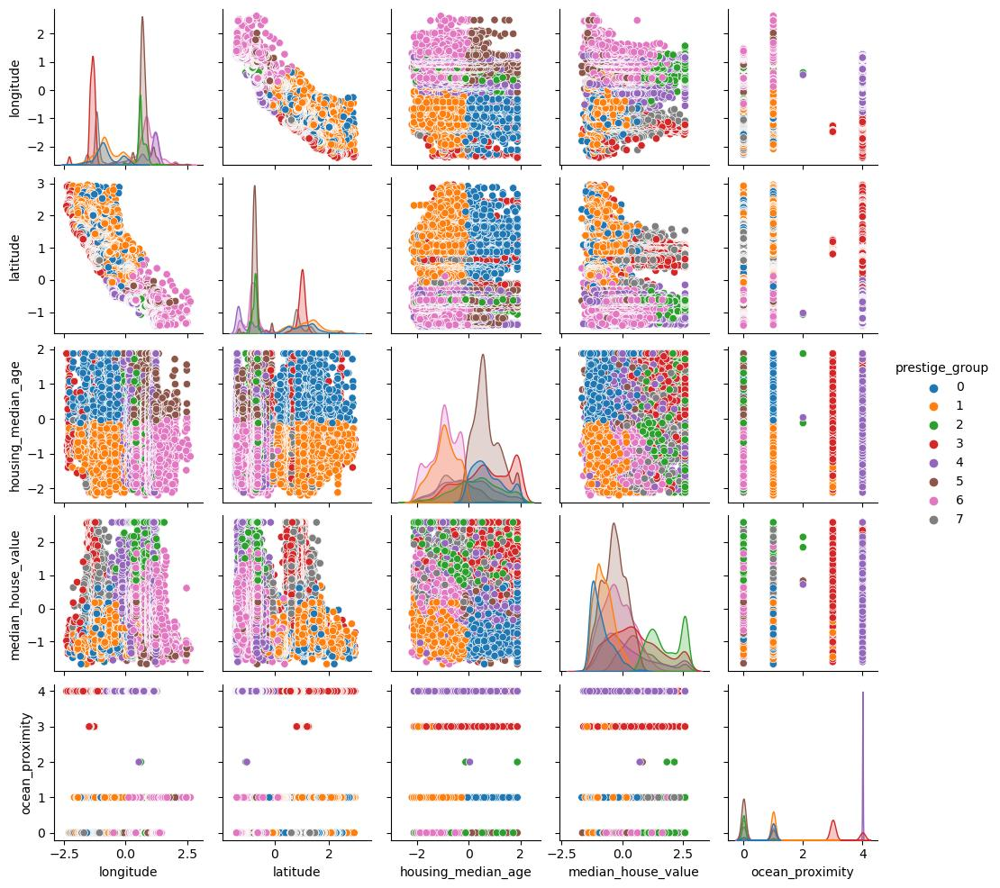

Amount of clusters: 9


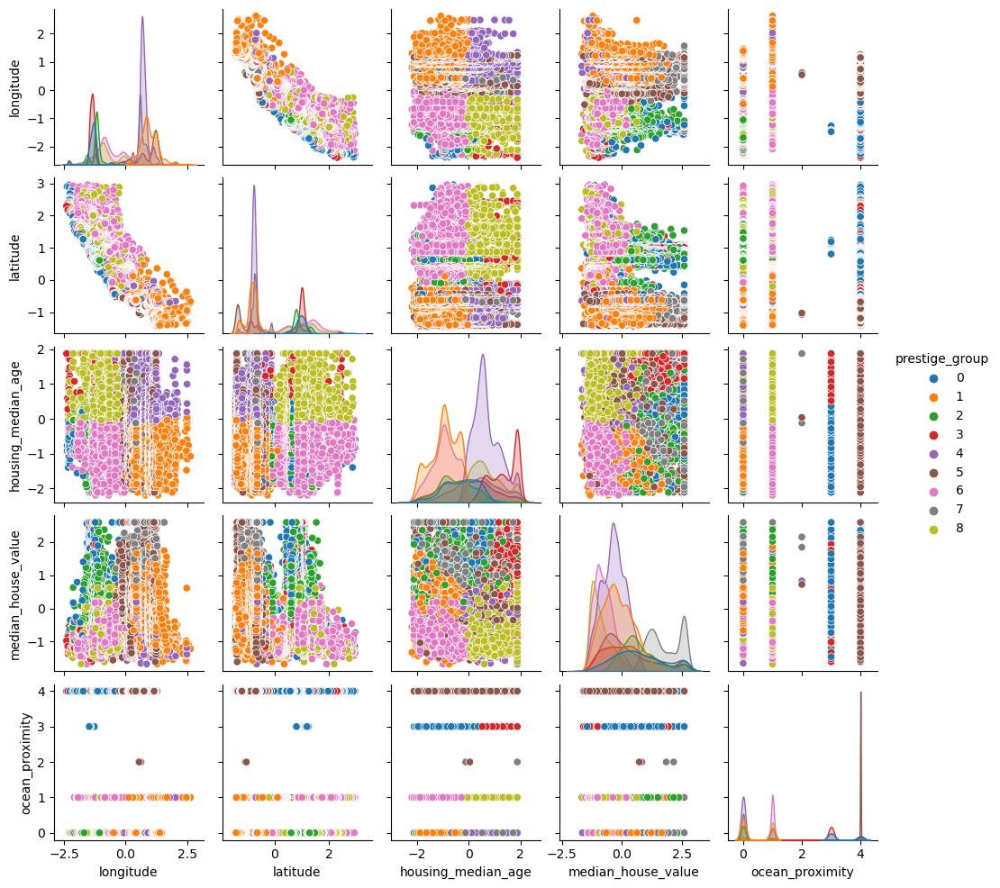

Amount of clusters: 10


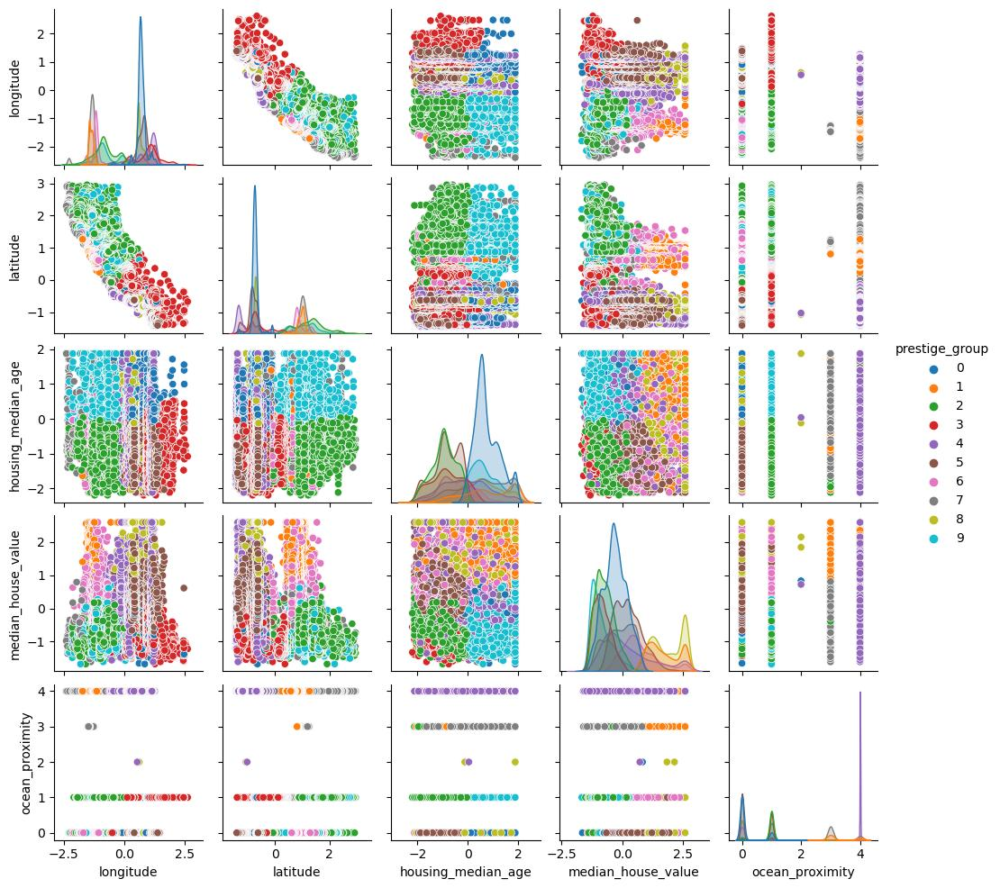

Amount of clusters: 11


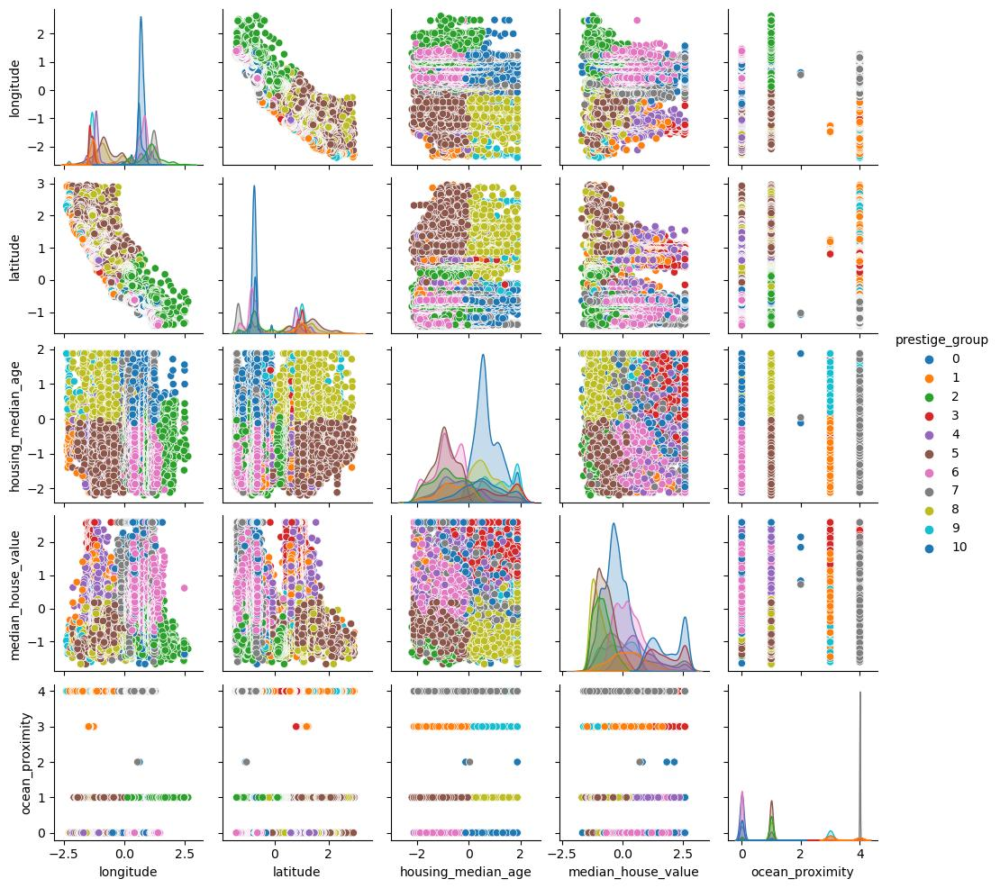

Amount of clusters: 12


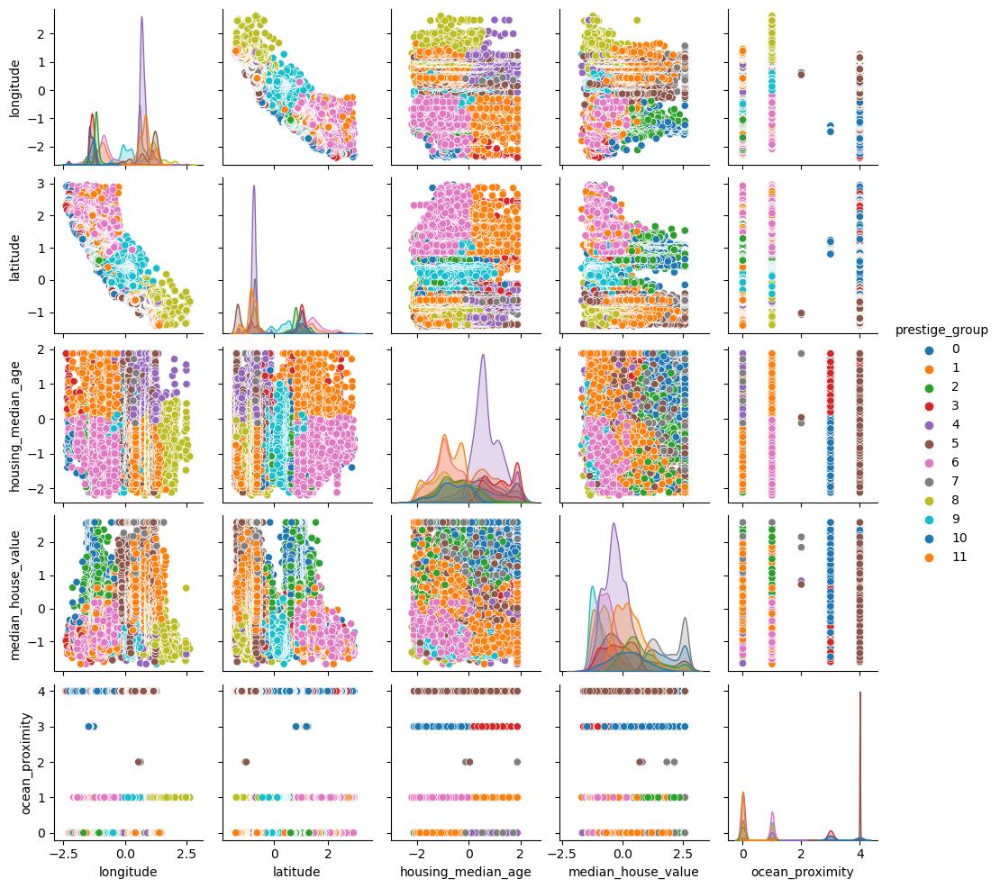

Amount of clusters: 13


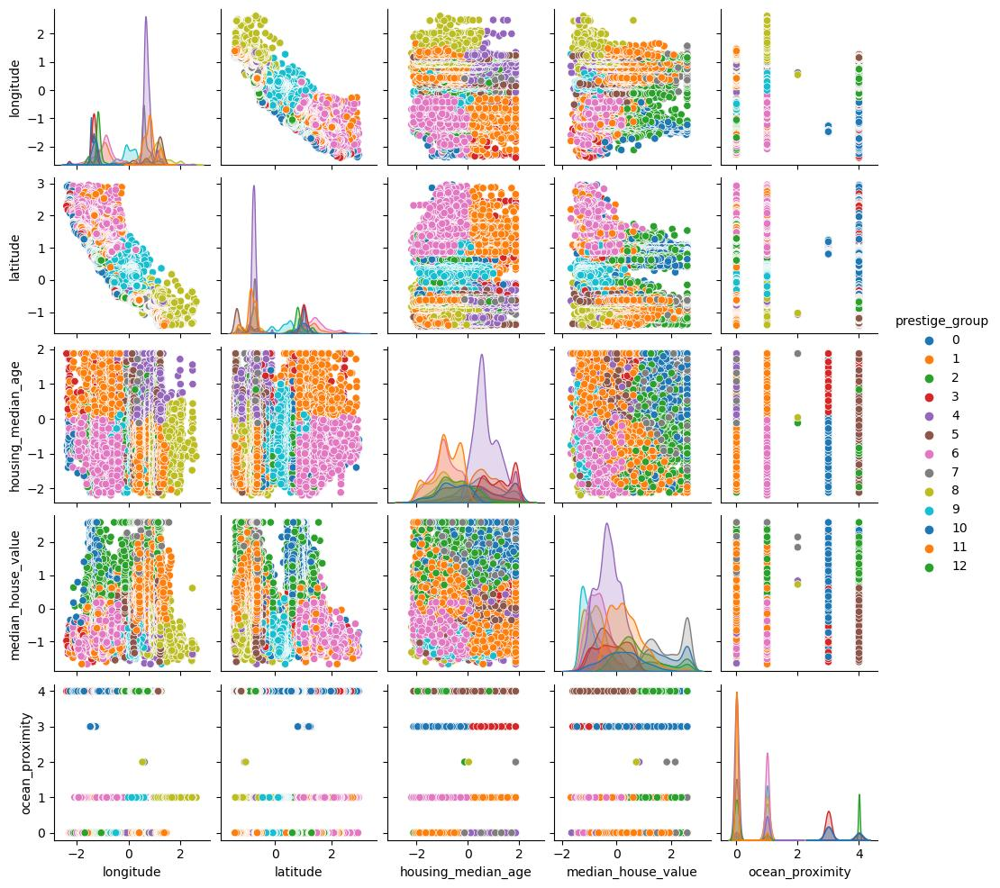

Amount of clusters: 14


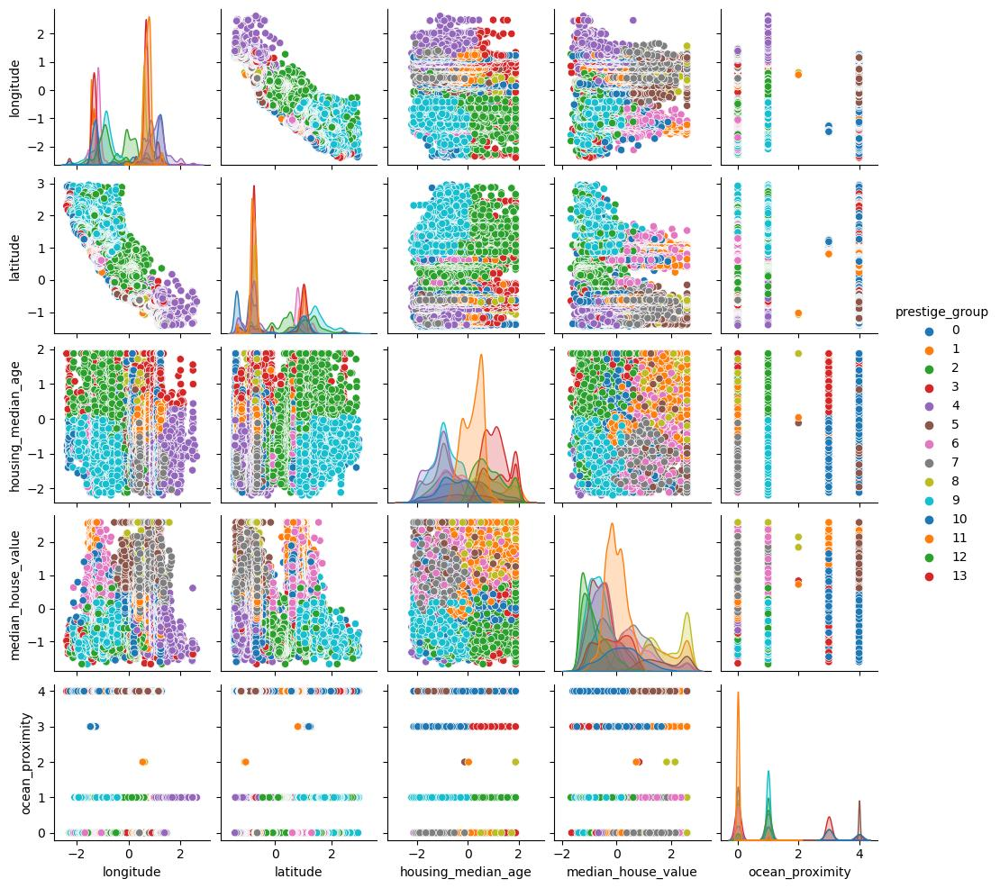

Amount of clusters: 15


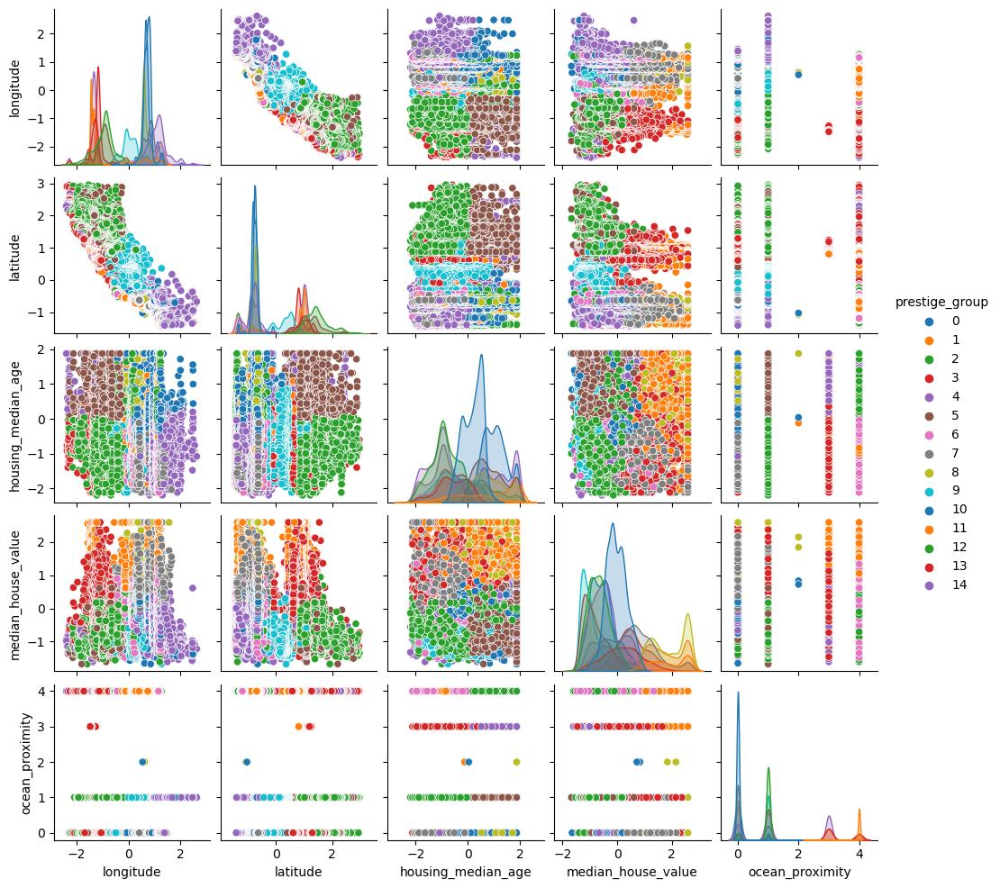

Amount of clusters: 16


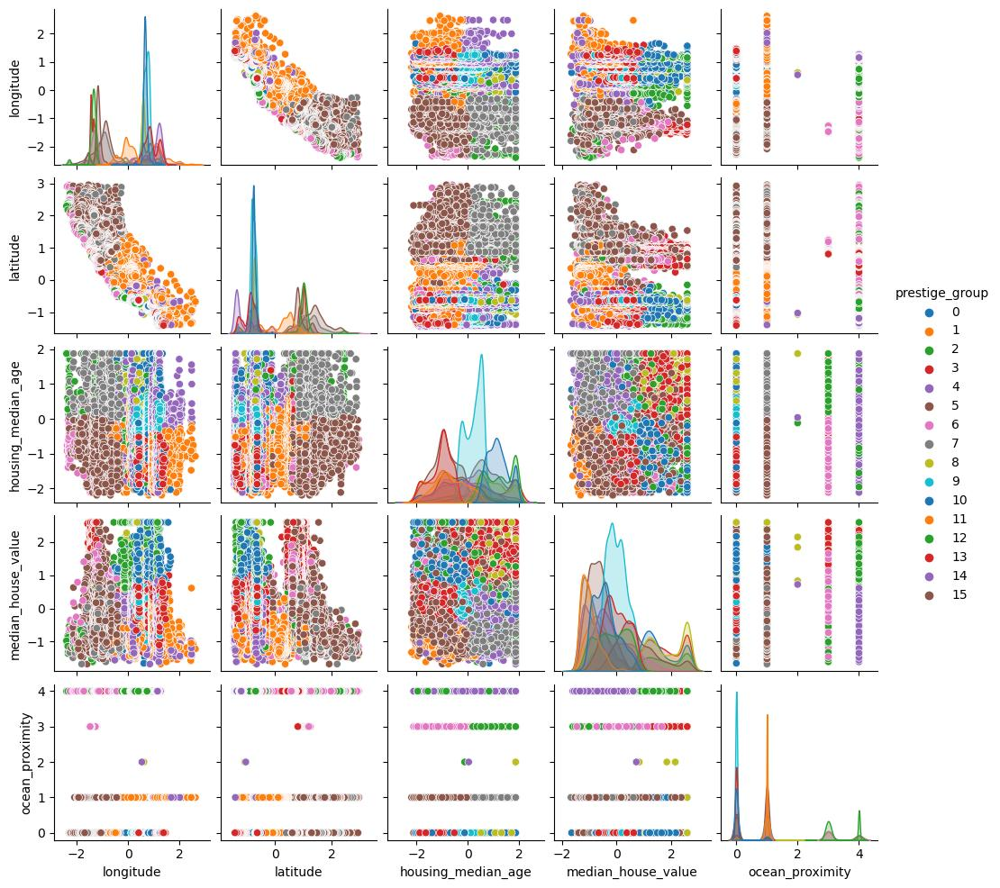

Amount of clusters: 17


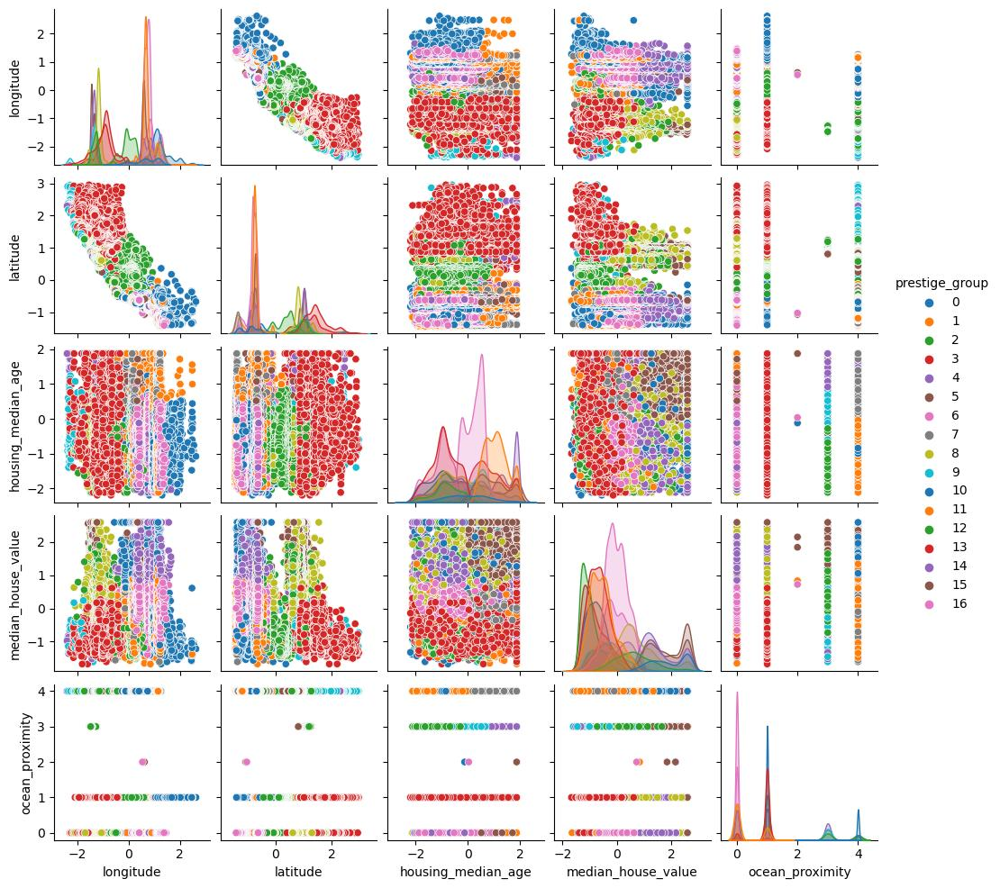

Amount of clusters: 18


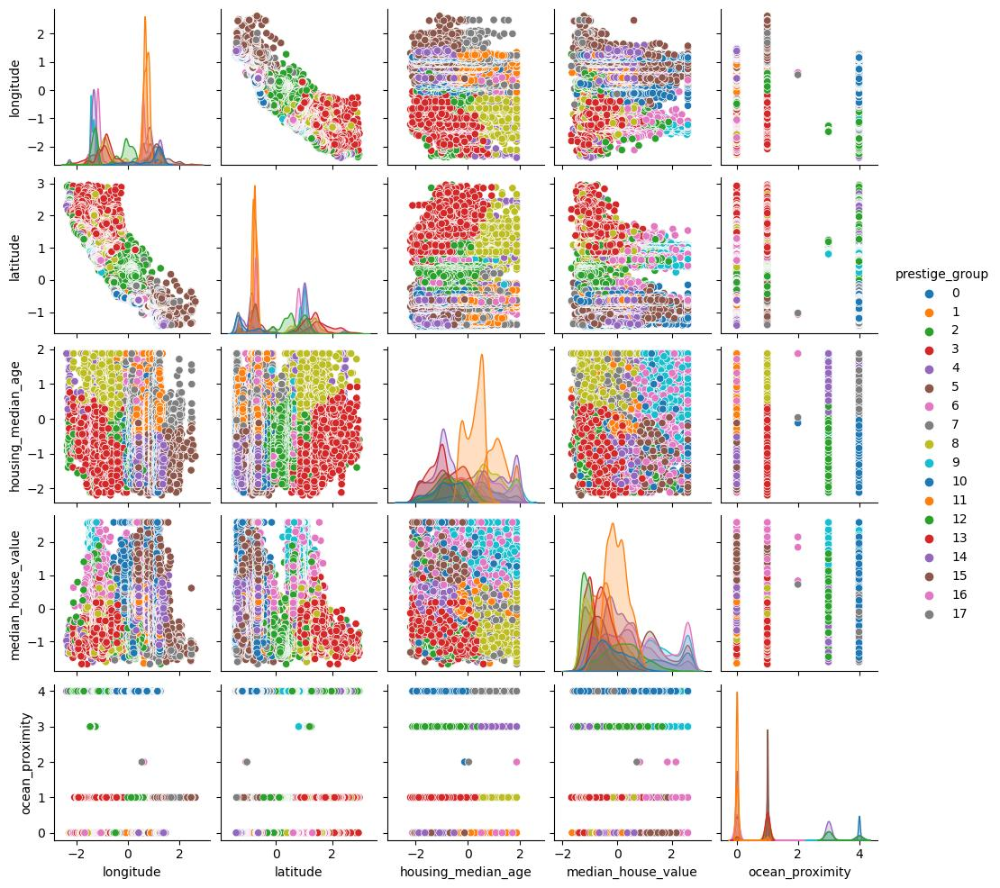

Amount of clusters: 19


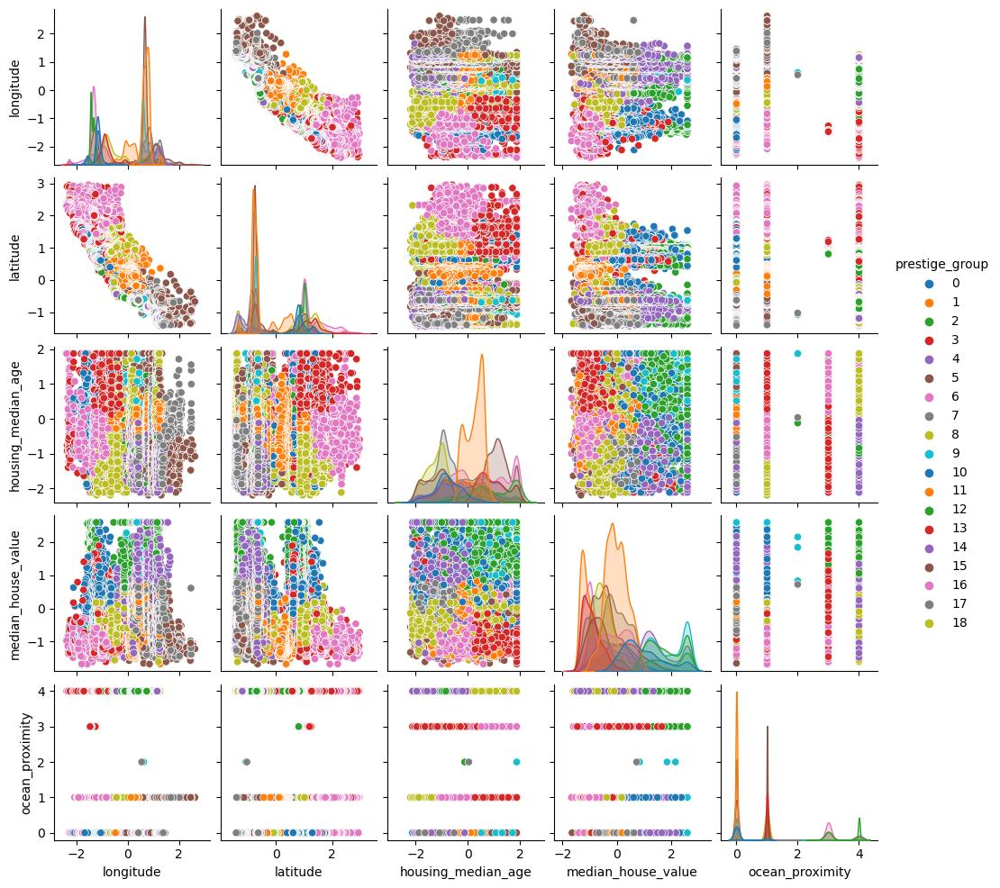

Amount of clusters: 20


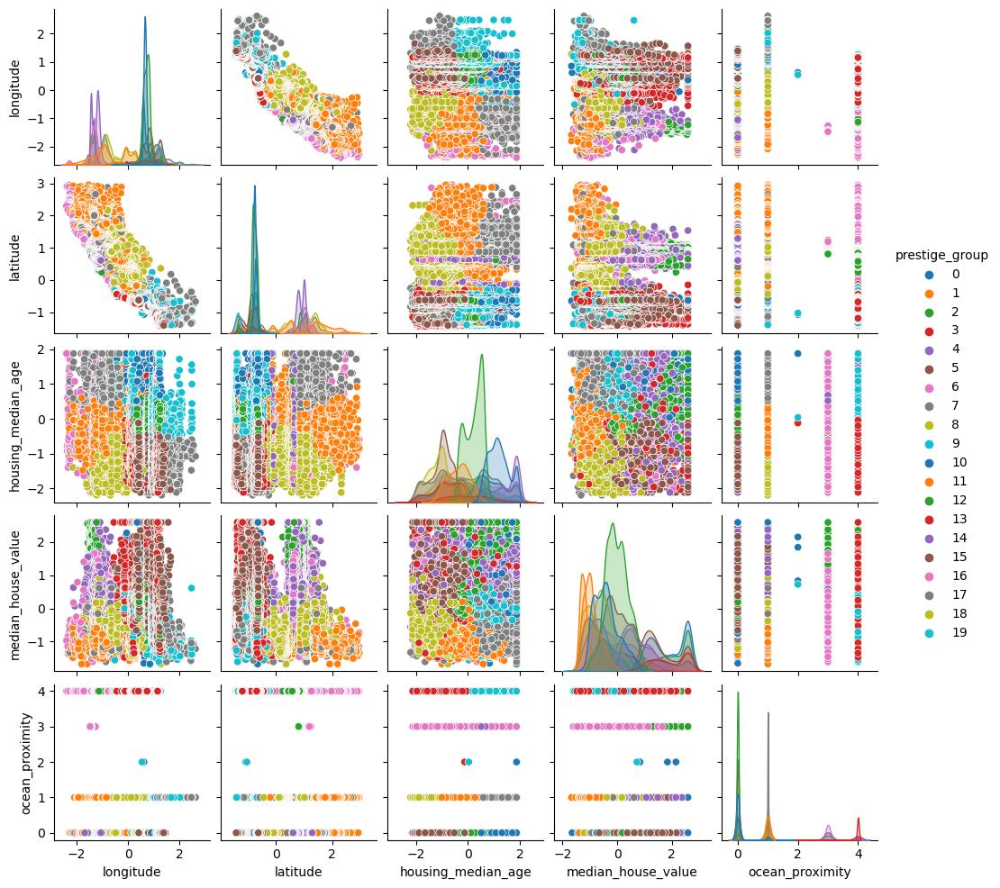

In [43]:
dataset_kmeans = dataset_clustering.copy()
squares = []
clusters_range = range(2, 21)
for i in clusters_range:
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, n_init = 10, random_state = 42)
    dataset_kmeans['prestige_group'] = kmeans.fit_predict(X)
    squares.append(kmeans.inertia_)
    sb.pairplot(dataset_kmeans, hue = 'prestige_group', palette = 'tab10', height = 2)     
    plt.show()

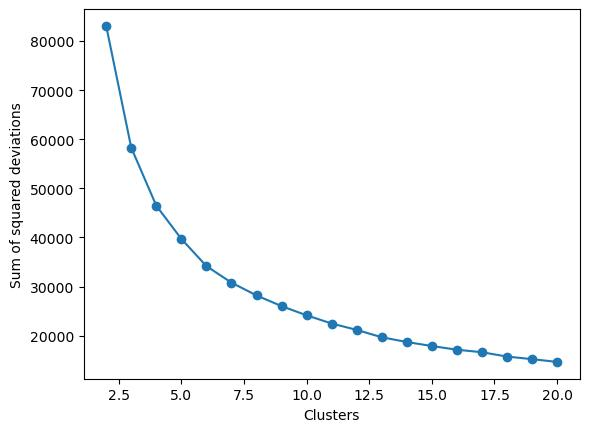

In [44]:
plot_scores(clusters_range, squares, 'Sum of squared deviations')

## Silhouette method

In [45]:
def calculate_silhouettes(dataframe):
    dataframe['silh_c'] = silhouette_samples(dataframe.drop(columns = ['label']), dataframe['label'])
    n_clusters = len(np.unique(dataframe['label']))
    silh_c = []
    average = silhouette_score(dataframe.drop(columns = ['label']), dataframe['label'])
    for i in range(n_clusters):
        df_i = dataframe[dataframe['label'] == i]
        silh_c += [df_i['silh_c'].values.mean()]
    return n_clusters, silh_c, average

def plot_silhouettes(n_clusters, silh_c, average):
    plt.barh(range(1, n_clusters + 1), silh_c)
    plt.vlines(average, 0.5, n_clusters + 0.5, linestyles = '--', colors = 'black')
    plt.show()

Amount of clusters: 2
Avg. value: 0.39365


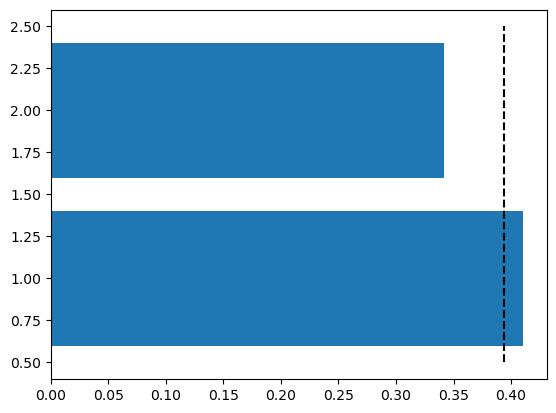


Amount of clusters: 3
Avg. value: 0.36925


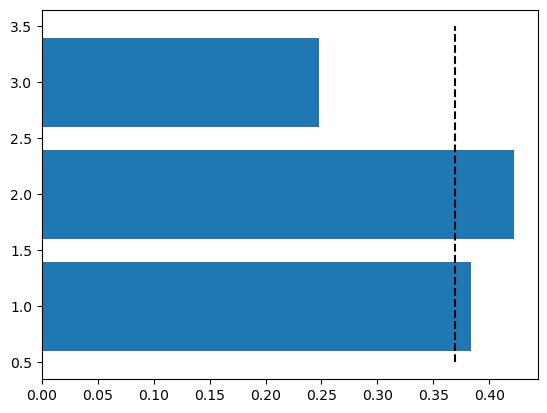


Amount of clusters: 4
Avg. value: 0.40604


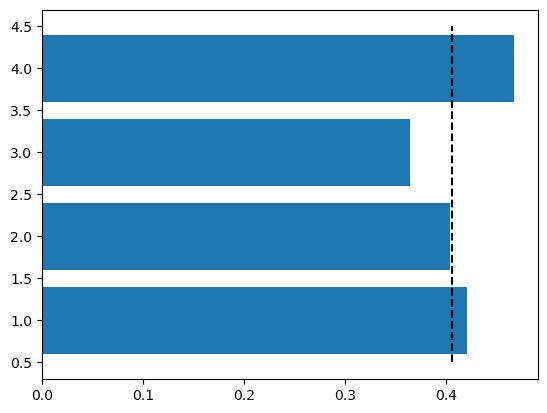


Amount of clusters: 5
Avg. value: 0.36672


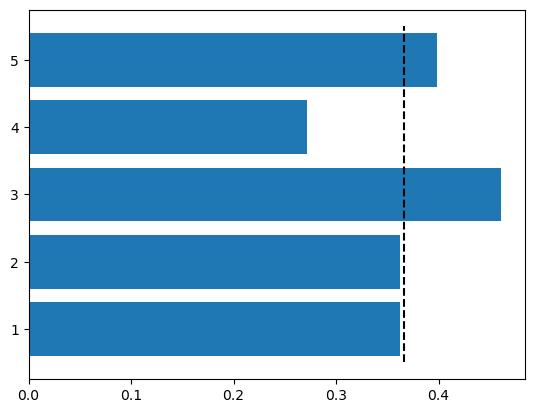


Amount of clusters: 6
Avg. value: 0.35753


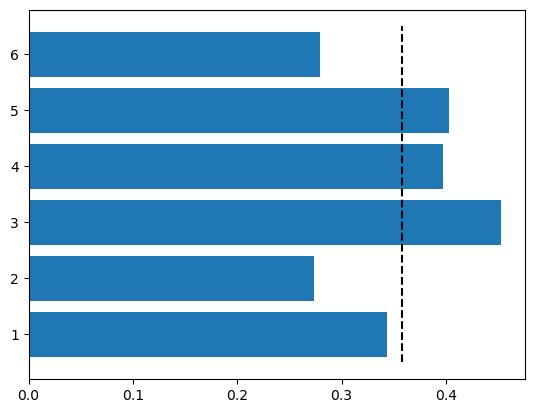


Amount of clusters: 7
Avg. value: 0.33140


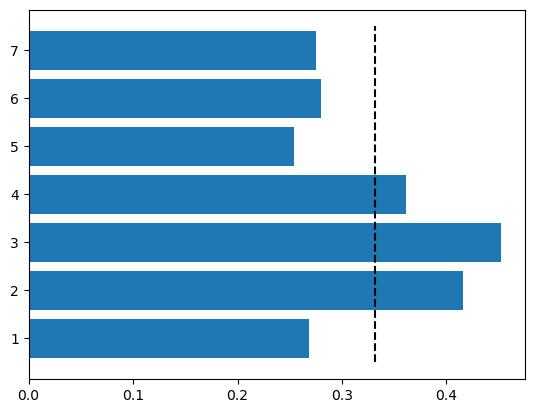


Amount of clusters: 8
Avg. value: 0.34143


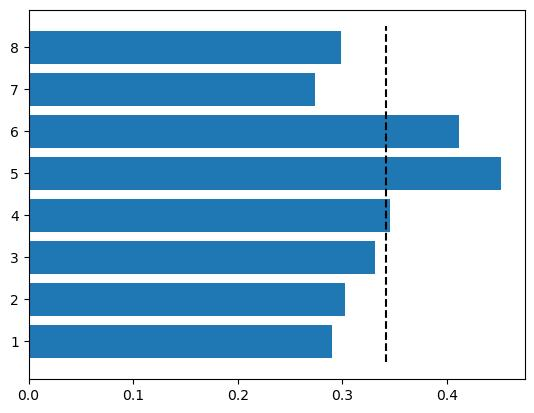


Amount of clusters: 9
Avg. value: 0.33112


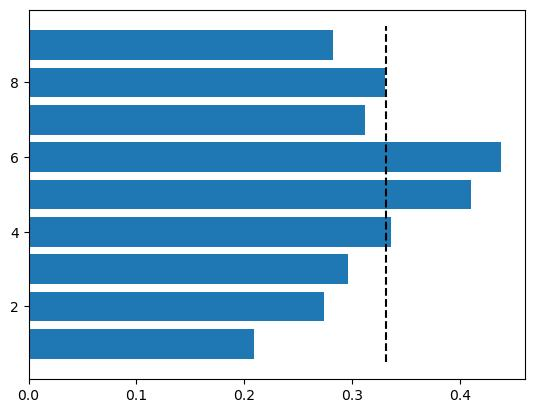


Amount of clusters: 10
Avg. value: 0.32484


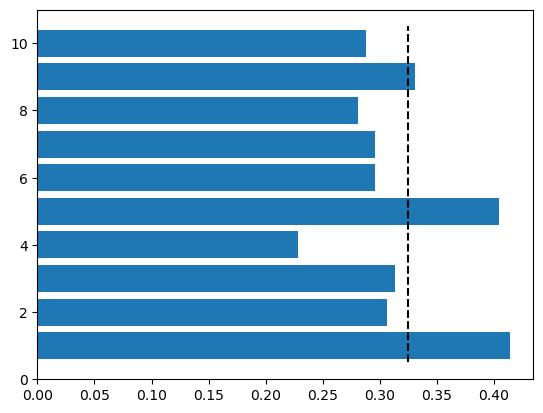


Amount of clusters: 11
Avg. value: 0.32875


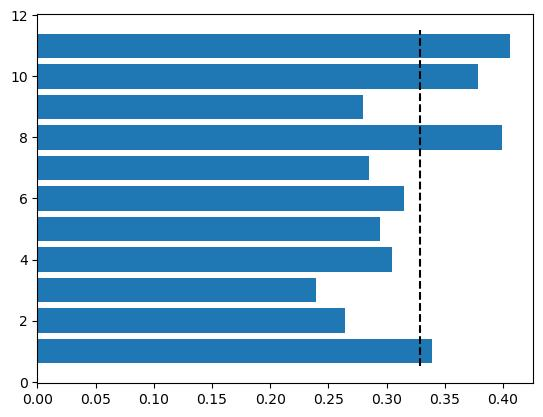


Amount of clusters: 12
Avg. value: 0.33264


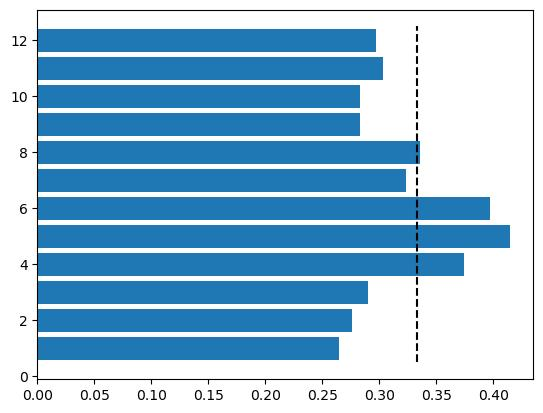


Amount of clusters: 13
Avg. value: 0.33109


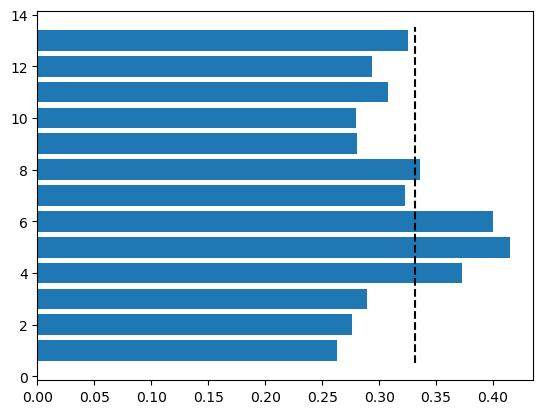


Amount of clusters: 14
Avg. value: 0.29936


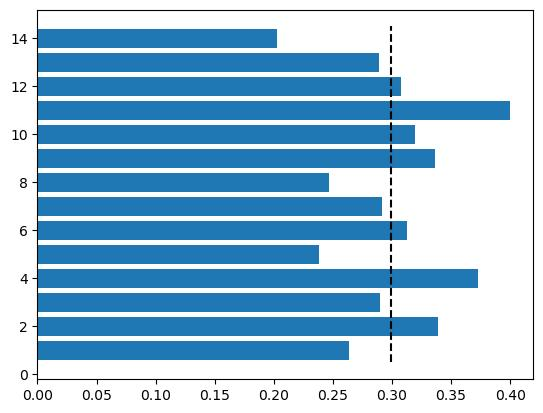


Amount of clusters: 15
Avg. value: 0.29562


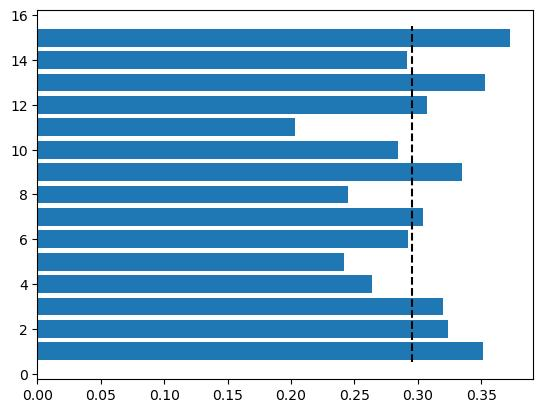


Amount of clusters: 16
Avg. value: 0.30361


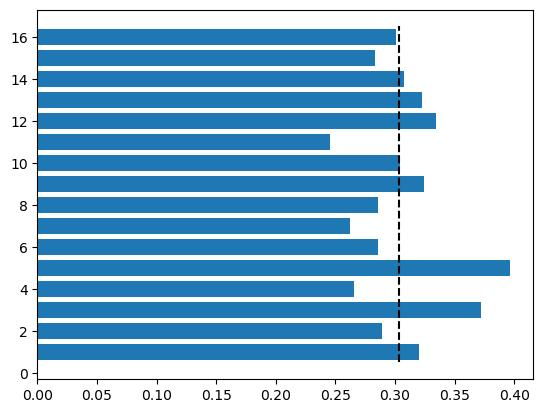


Amount of clusters: 17
Avg. value: 0.28749


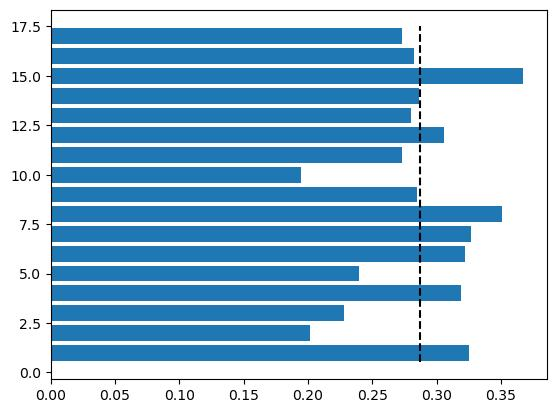


Amount of clusters: 18
Avg. value: 0.28769


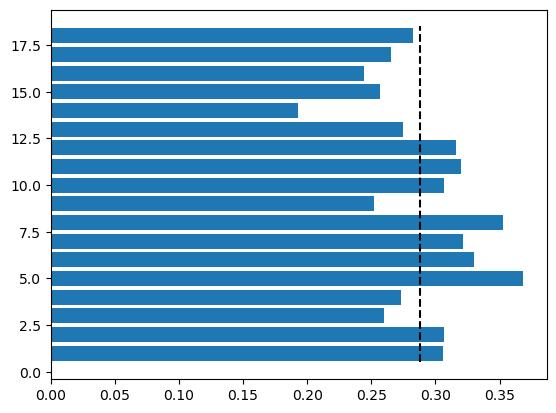


Amount of clusters: 19
Avg. value: 0.28893


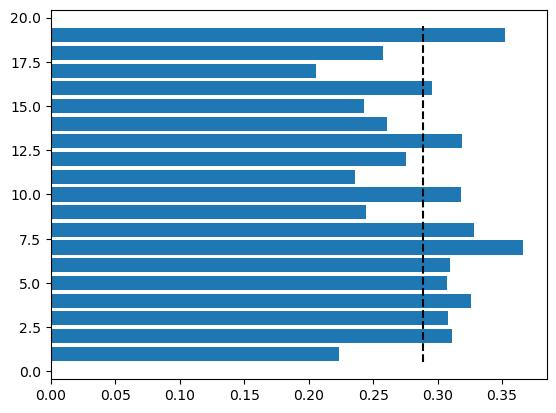


Amount of clusters: 20
Avg. value: 0.28564


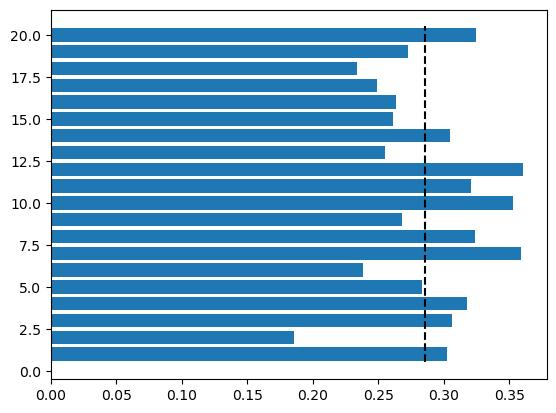



Max. silhouette coefficient: 0.40604086290461466 (amount of clusters: 4)


In [46]:
dataset_kmeans = dataset_clustering.copy()
averages = []
for i in range(2, 21):
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, random_state = 42)
    dataset_kmeans['label'] = kmeans.fit_predict(dataset_clustering.values)
    n_clusters, silh_c, average = calculate_silhouettes(dataset_kmeans)
    averages.append((i, average))
    print(f'Avg. value: {average:.5f}')
    plot_silhouettes(n_clusters, silh_c, average)
    print('')

sorted_averages = sorted(averages, key = lambda x: x[1], reverse = True)
max_value = sorted_averages[0]
print('')
print(f'Max. silhouette coefficient: {max_value[1]} (amount of clusters: {max_value[0]})')

Amount of clusters: 2


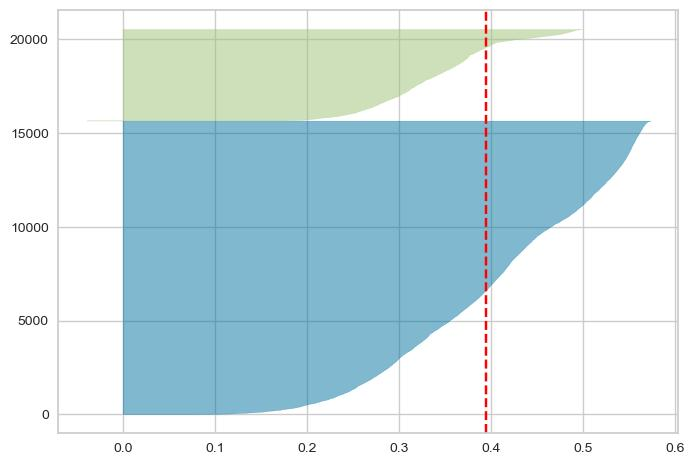

Amount of clusters: 3


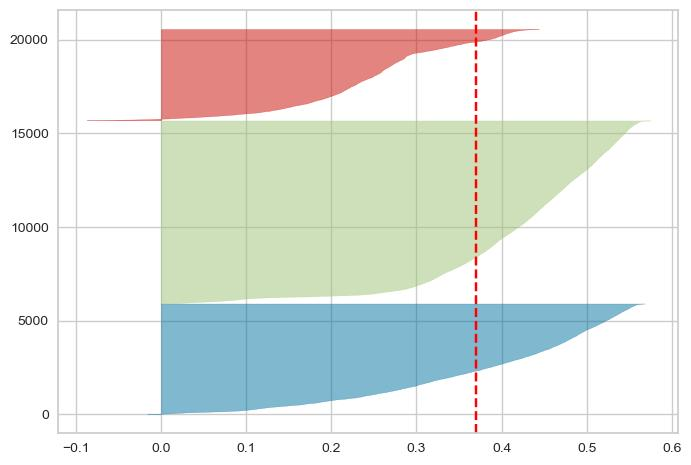

Amount of clusters: 4


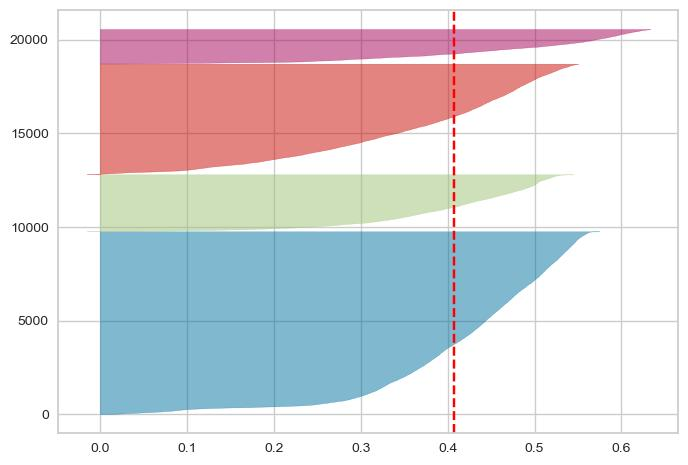

Amount of clusters: 5


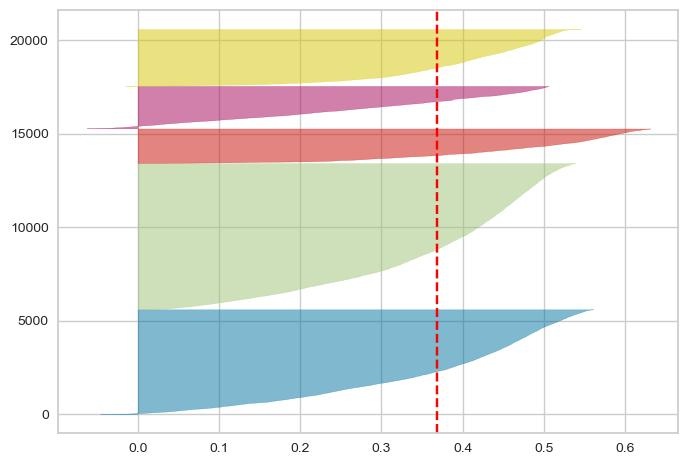

Amount of clusters: 6


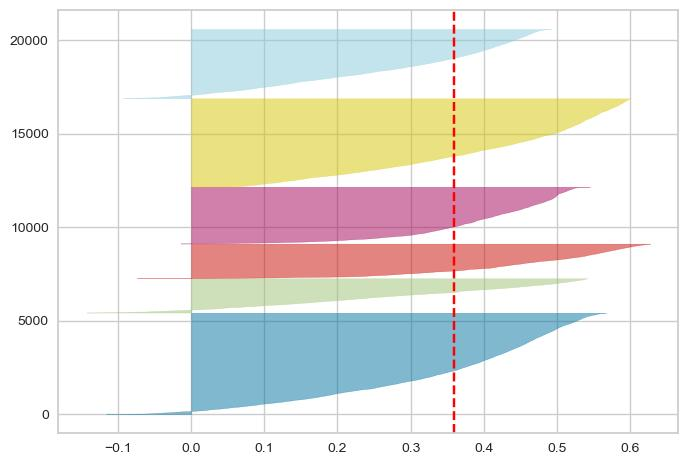

Amount of clusters: 7


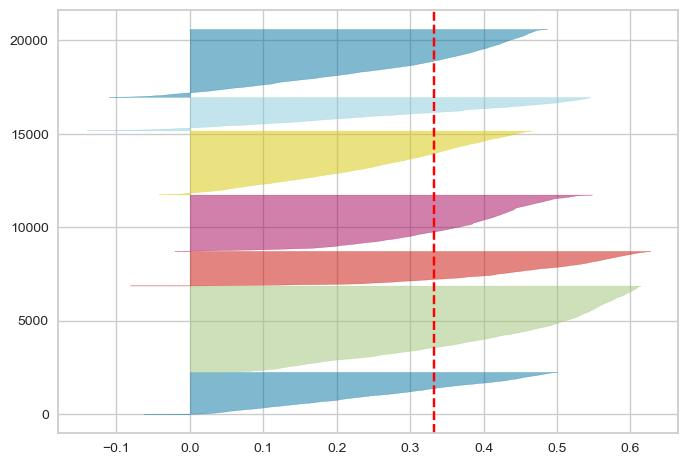

Amount of clusters: 8


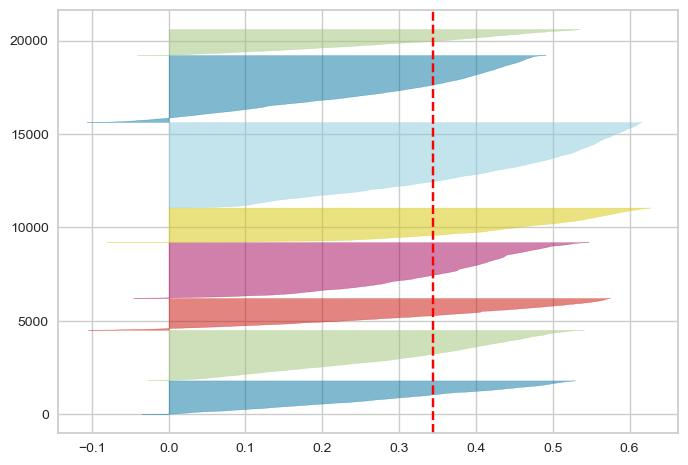

Amount of clusters: 9


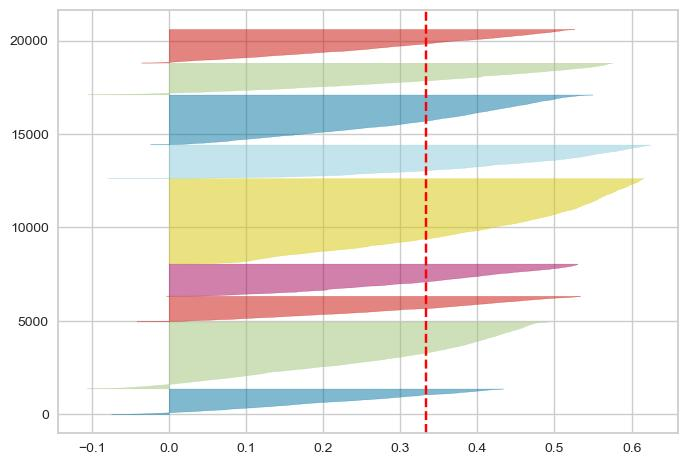

Amount of clusters: 10


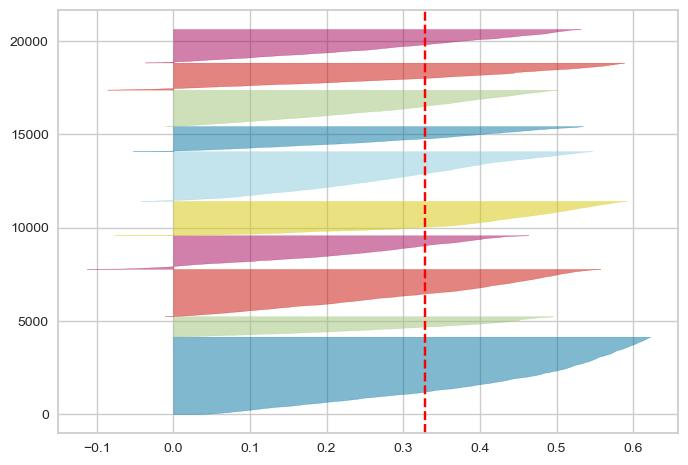

Amount of clusters: 11


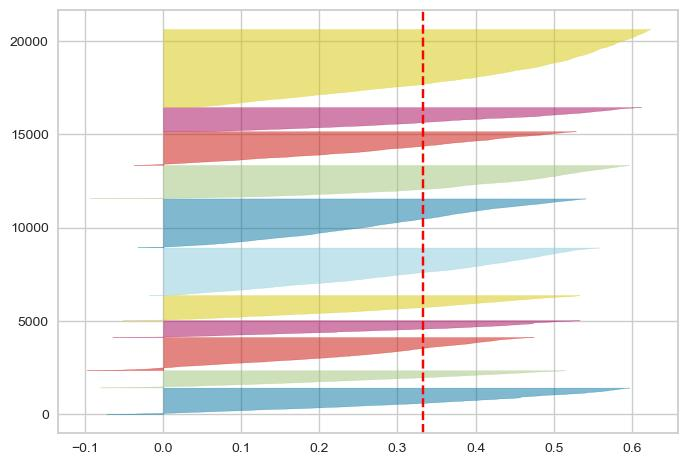

Amount of clusters: 12


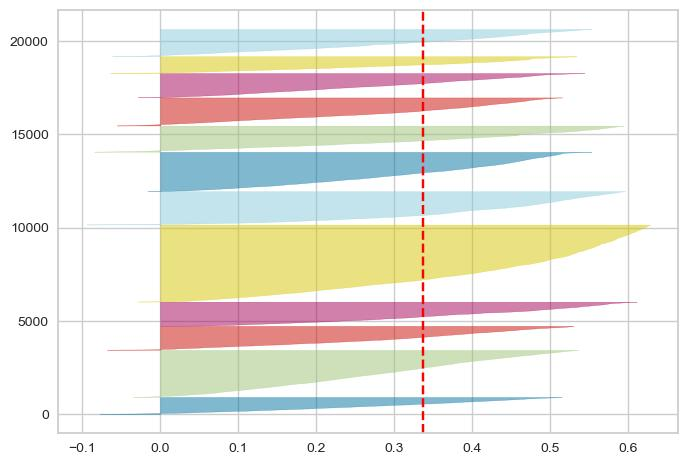

Amount of clusters: 13


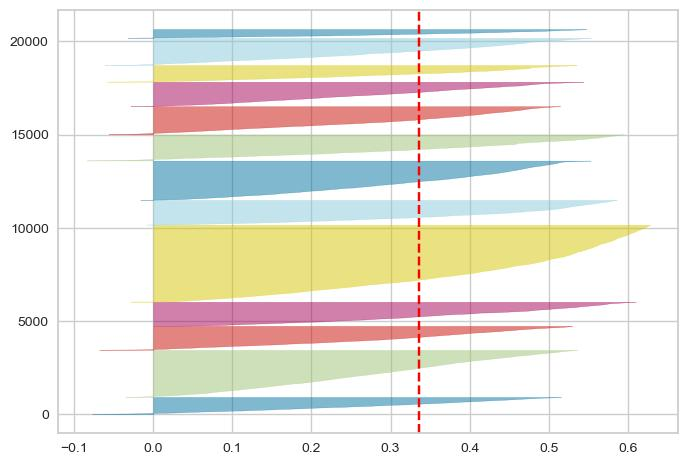

Amount of clusters: 14


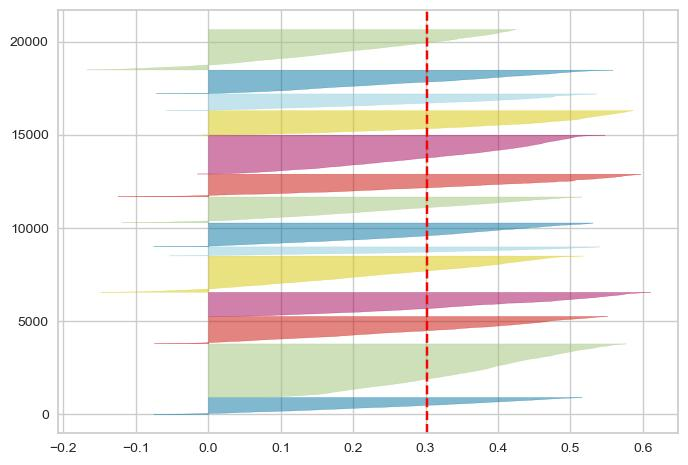

Amount of clusters: 15


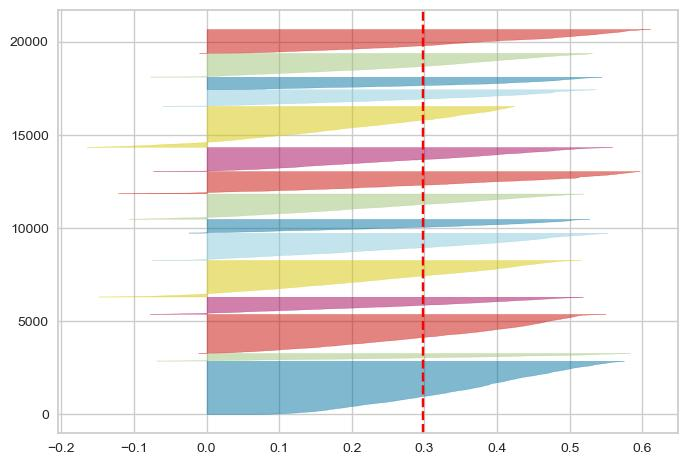

Amount of clusters: 16


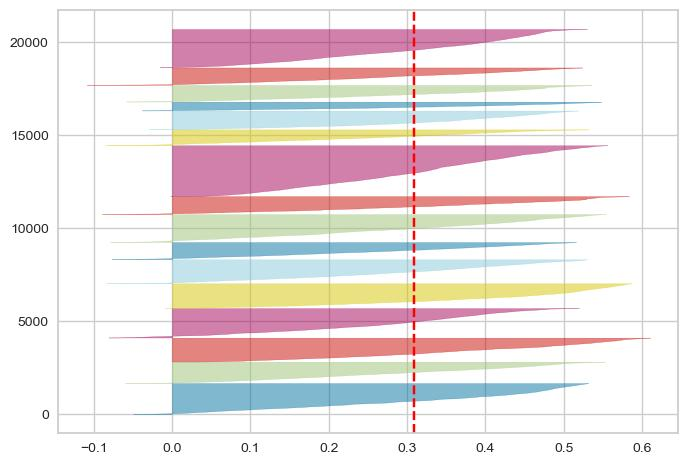

Amount of clusters: 17


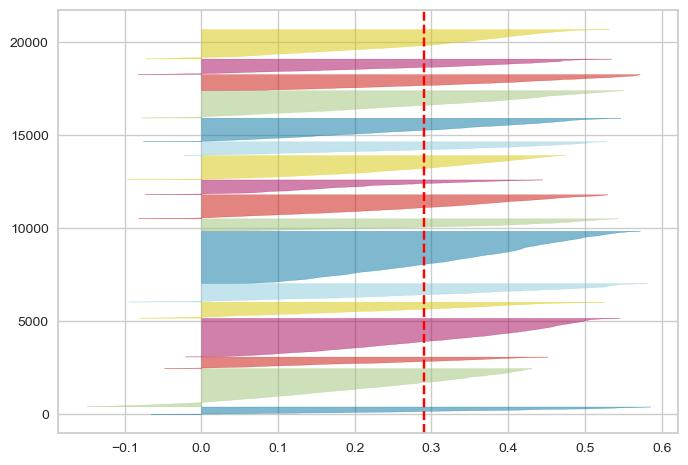

Amount of clusters: 18


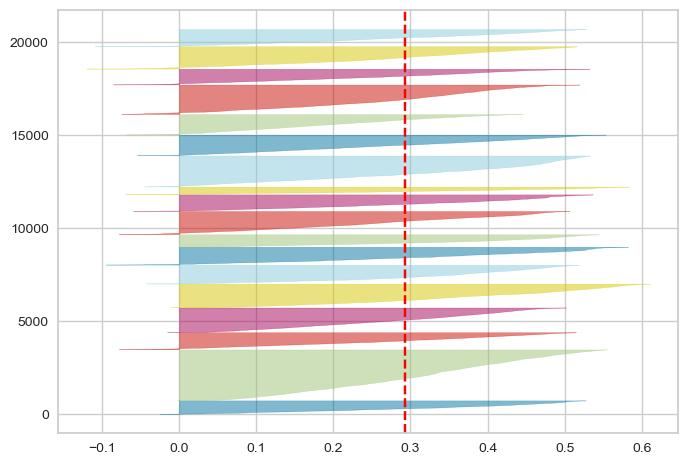

Amount of clusters: 19


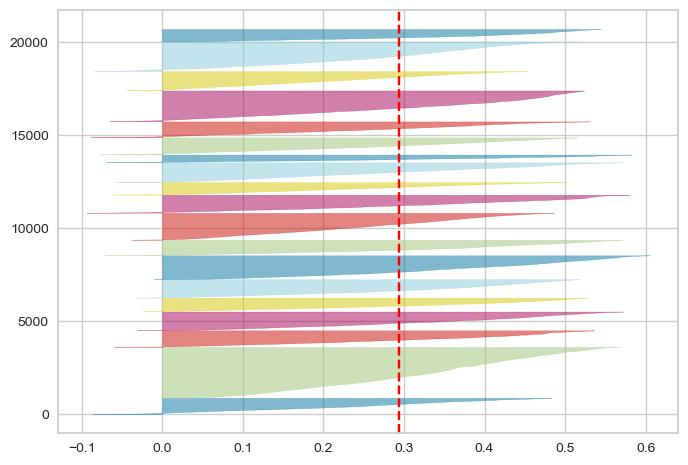

Amount of clusters: 20


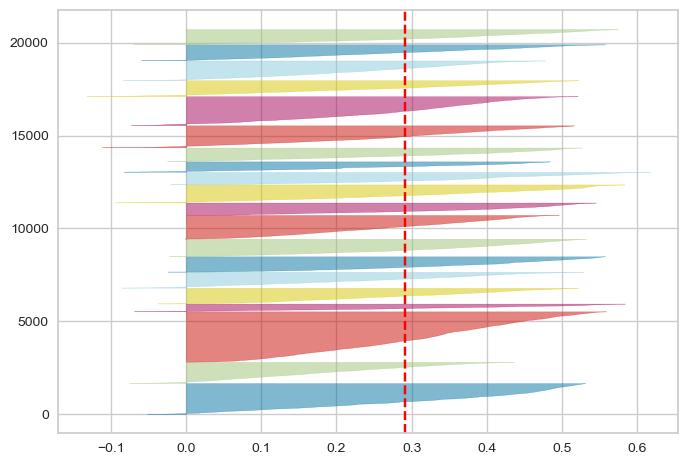

In [47]:
from yellowbrick.cluster import SilhouetteVisualizer

for i in range(2, 21):
    print(f'Amount of clusters: {i}')
    kmeans = KMeans(n_clusters = i, random_state = 42)
    visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick')
    visualizer.fit(X)
    plt.show()

## Graphical description of clustered data (K-Means)

In [77]:
def describe_clustered_data(df):
    sb.pairplot(df, hue = 'prestige_group', palette = 'tab10')
    plt.show()
    sb.countplot(x = df['prestige_group'])
    plt.show()
    sb.barplot(x = 'prestige_group', y = 'housing_median_age', data = df)
    plt.show()
    sb.barplot(x = 'prestige_group', y = 'median_house_value', data = df)
    plt.show()

In [53]:
print_best_coefficients('Silhouette', sil_scores)
print_best_coefficients('Calinski-Harabasz', calinski_scores)
print_best_coefficients('Davies-Bouldin', davies_scores, False)

Max. Silhouette score: 0.407 (clusters: 4)
Max. Calinski-Harabasz score: 11485.417 (clusters: 3)
Min. Davies-Bouldin score: 0.986 (clusters: 6)


Amount of clusters: 3


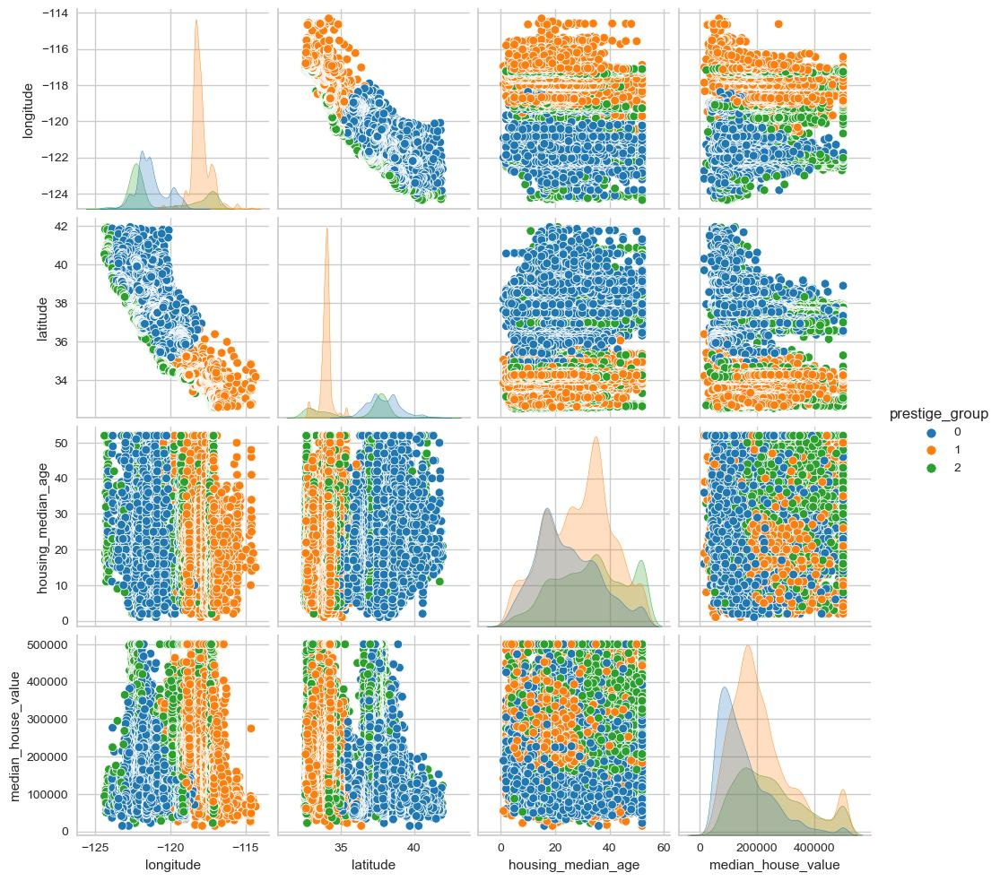

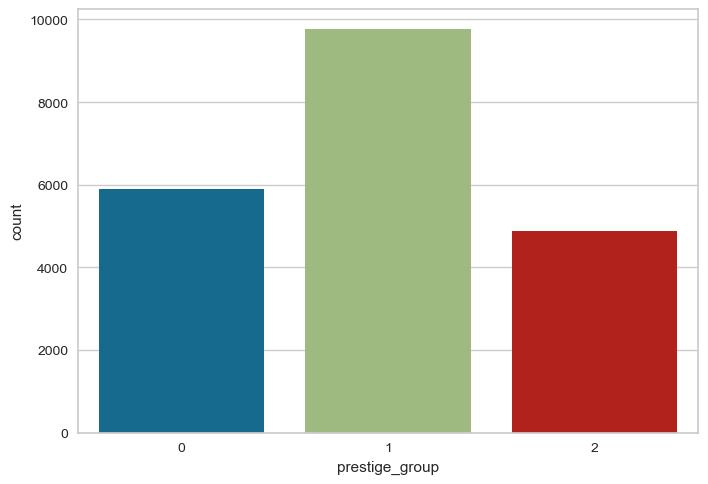

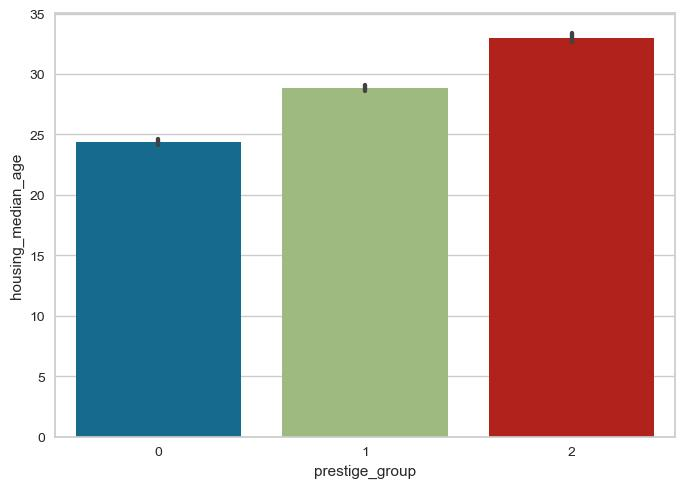

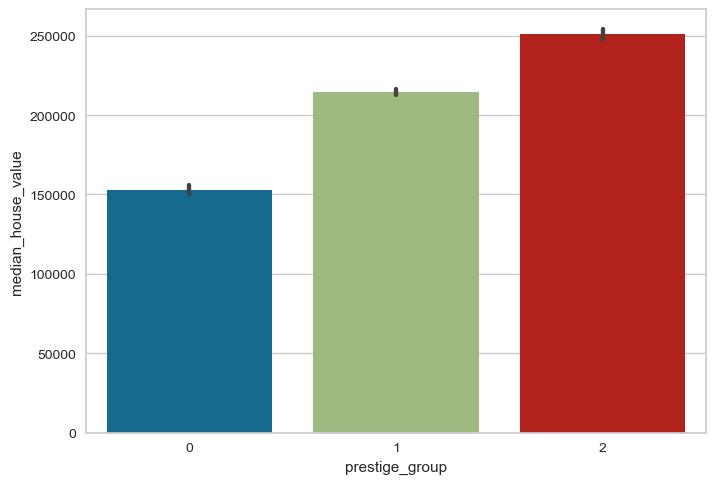


Amount of clusters: 4


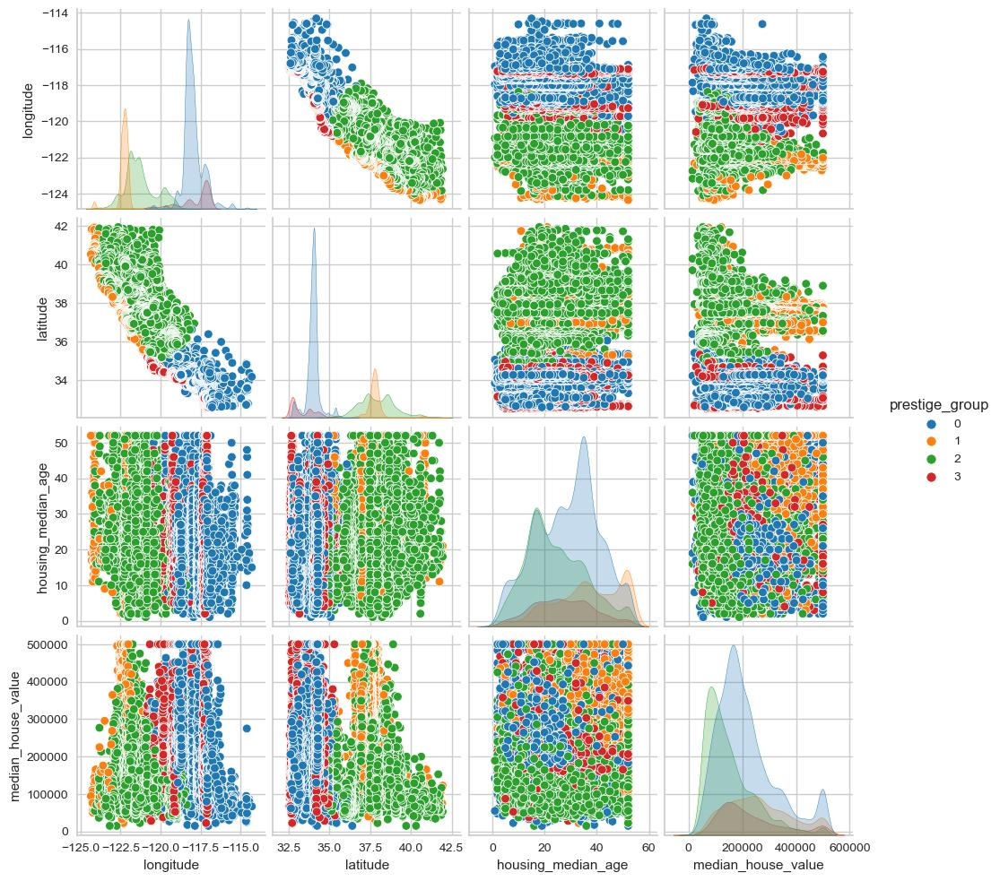

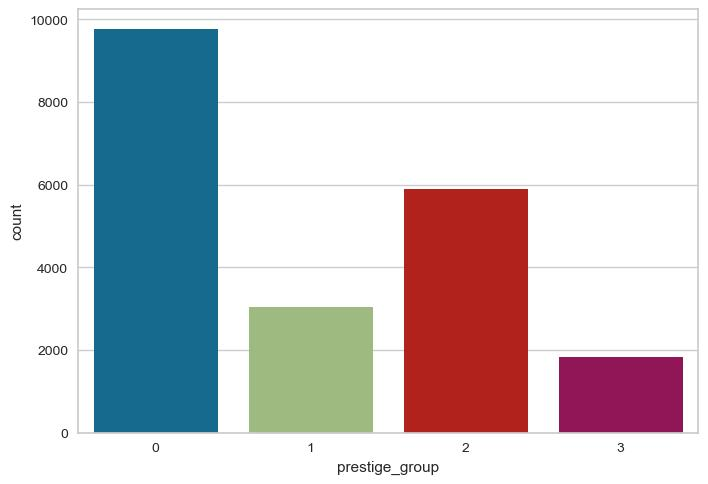

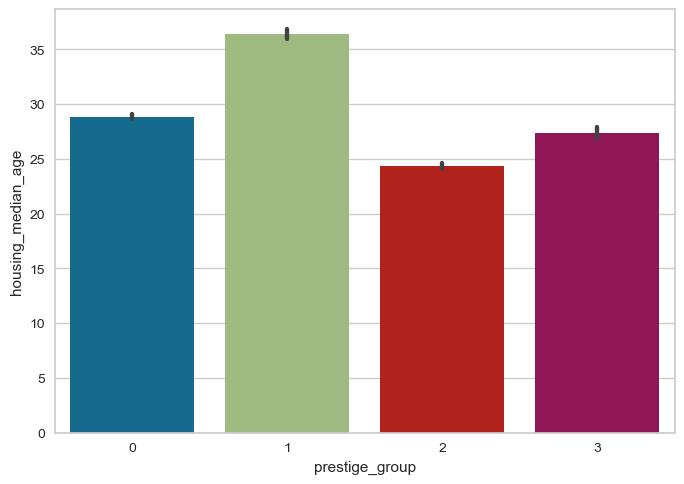

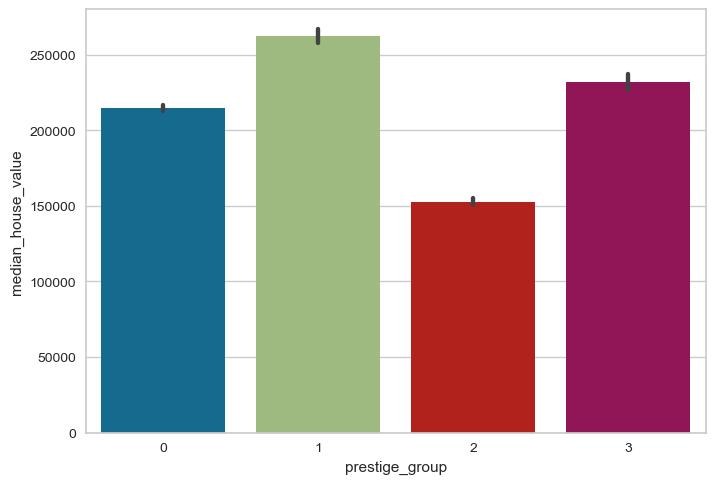


Amount of clusters: 6


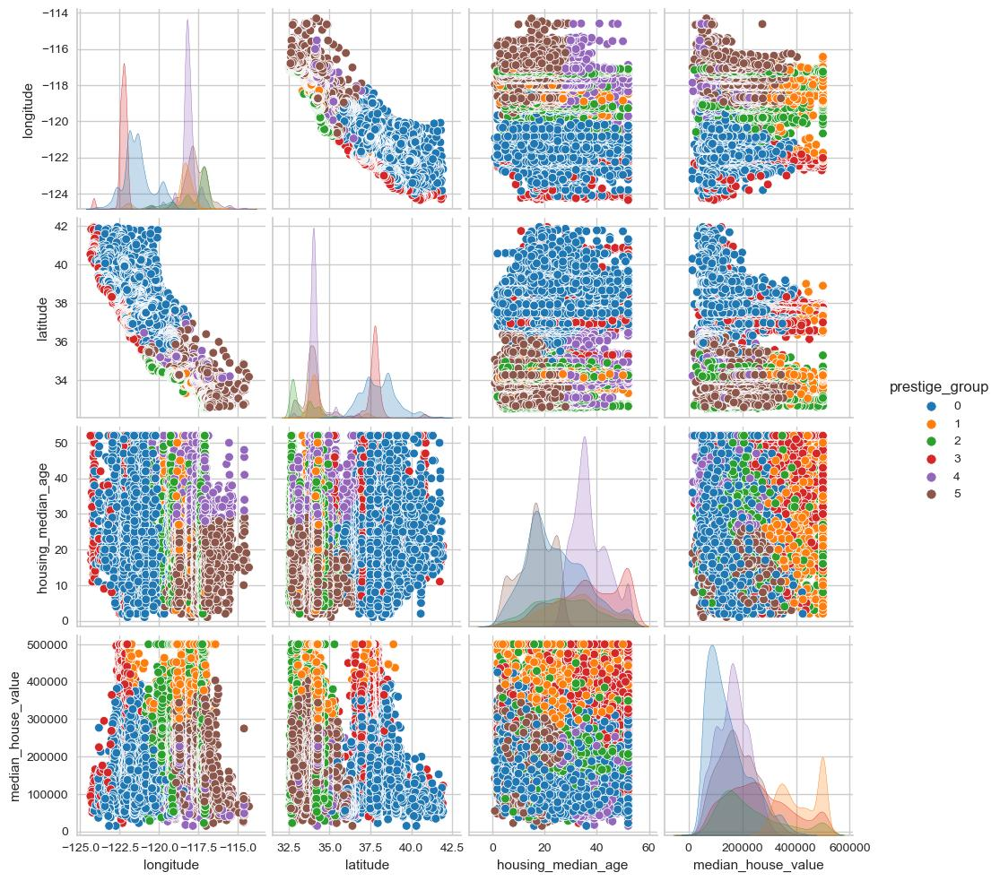

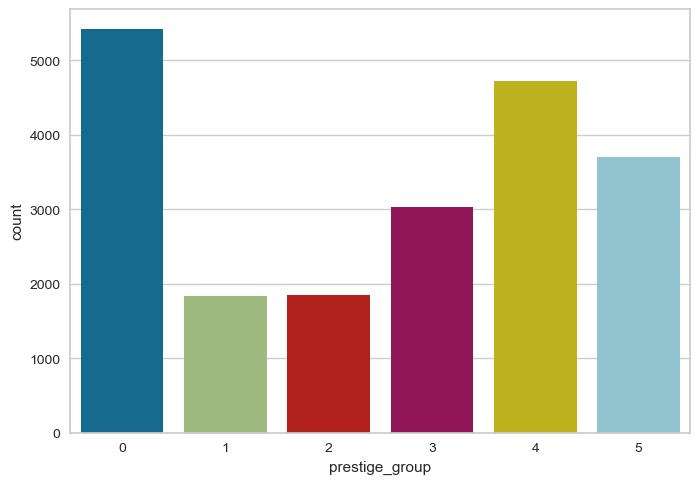

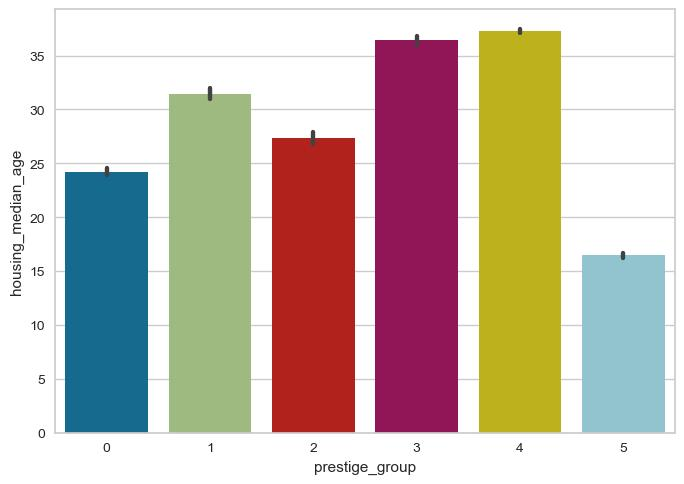

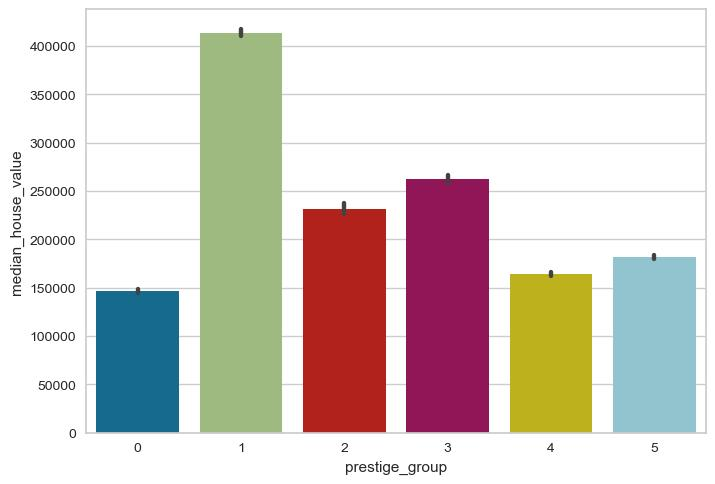

In [78]:
nums_of_clusters = sorted([4, 3, 6])
for num_of_clusters in nums_of_clusters:
    print(f'Amount of clusters: {num_of_clusters}')
    kmeans = KMeans(n_clusters = num_of_clusters, random_state = 42)
    groups = kmeans.fit_predict(X)
    dataset_after_clustering = dataset.copy()
    dataset_after_clustering['prestige_group'] = groups
    describe_clustered_data(dataset_after_clustering)
    print('')

# DBSCAN clustering

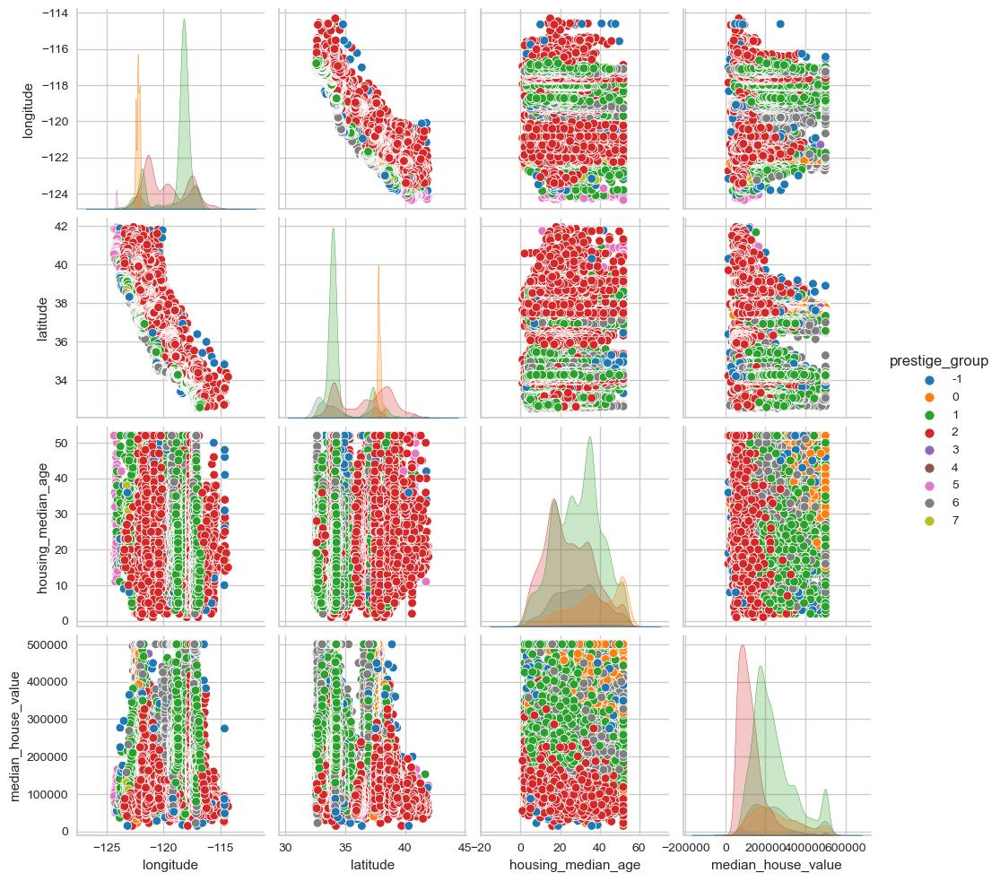

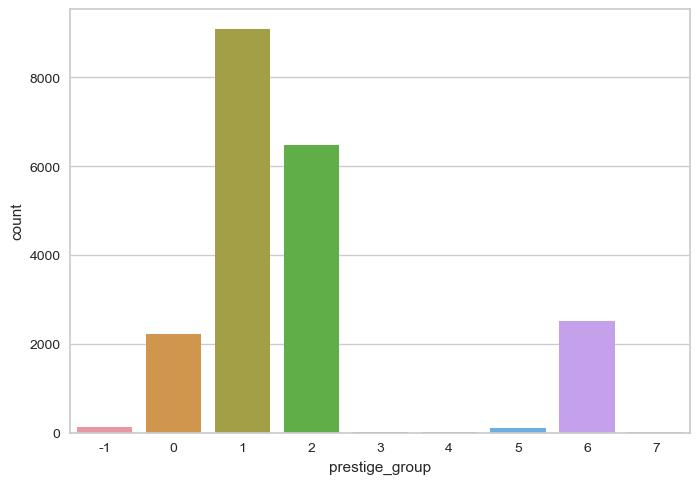

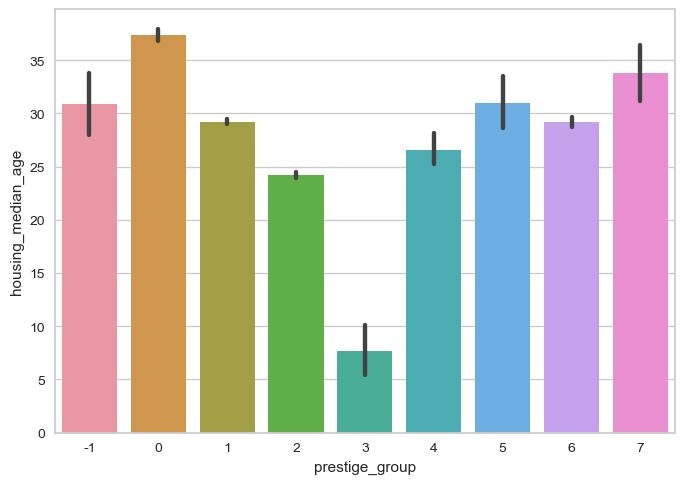

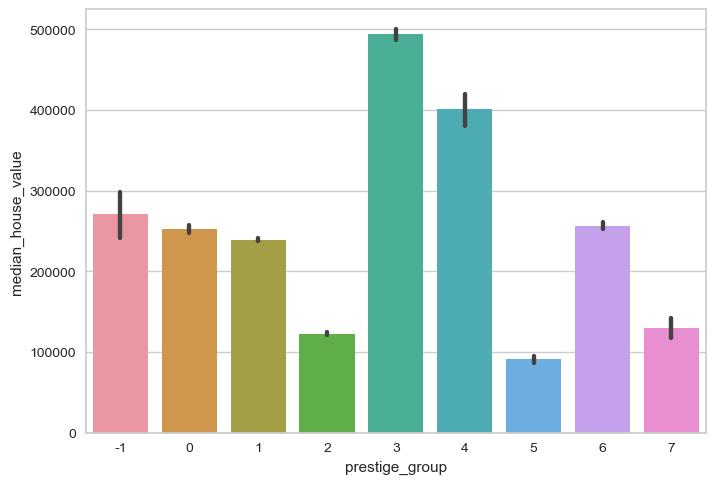

In [79]:
dbscan = DBSCAN()
groups = dbscan.fit_predict(dataset_clustering.values)
dataset_after_clustering = dataset.copy()
dataset_after_clustering['prestige_group'] = groups
describe_clustered_data(dataset_after_clustering)

## Best clustering metric scores for DBSCAN

In [86]:
def print_best_coefficients_dbscan(method_name, scores, find_max = True):
    sorted_scores = sorted(scores, key = lambda x: x[1], reverse = find_max)
    best_score = sorted_scores[0]
    print(f'{"Max." if find_max else "Min."} {method_name} score: {best_score[1]:.3f} (clusters: {best_score[2]}, eps.: {best_score[0]})')

sil_scores = []
calinski_scores = []
davies_scores = []

eps_range = np.arange(0.5, 2.05, 0.05)
for eps in eps_range:
    dbscan = DBSCAN(eps = eps)
    predicted_labels = dbscan.fit_predict(X)
    num_of_clusters = np.unique(predicted_labels).shape[0]
    print(f'Eps.: {eps}, amount of clusters: {num_of_clusters}')
    
    sil_score = silhouette_score(X, predicted_labels)
    print(f'Silhouette coefficient: {sil_score:.3f}')
    sil_scores.append((eps, sil_score, num_of_clusters))
    
    calinski_score = calinski_harabasz_score(X, predicted_labels)
    print(f'Calinski-Harabasz score: {calinski_score:.3f}')
    calinski_scores.append((eps, calinski_score, num_of_clusters))
    
    davies_score = davies_bouldin_score(X, predicted_labels)
    print(f'Davies-Bouldin score: {davies_score:.3f}')
    davies_scores.append((eps, davies_score, num_of_clusters))
    print()

print_best_coefficients_dbscan('Silhouette', sil_scores)
print_best_coefficients_dbscan('Calinski-Harabasz', calinski_scores)
print_best_coefficients_dbscan('Davies-Bouldin', davies_scores, False)

Eps.: 0.5, amount of clusters: 9
Silhouette coefficient: 0.148
Calinski-Harabasz score: 2592.948
Davies-Bouldin score: 1.822

Eps.: 0.55, amount of clusters: 6
Silhouette coefficient: 0.238
Calinski-Harabasz score: 4132.729
Davies-Bouldin score: 2.161

Eps.: 0.6000000000000001, amount of clusters: 6
Silhouette coefficient: 0.238
Calinski-Harabasz score: 4138.436
Davies-Bouldin score: 2.047

Eps.: 0.6500000000000001, amount of clusters: 6
Silhouette coefficient: 0.237
Calinski-Harabasz score: 4142.291
Davies-Bouldin score: 1.872

Eps.: 0.7000000000000002, amount of clusters: 5
Silhouette coefficient: 0.231
Calinski-Harabasz score: 4880.307
Davies-Bouldin score: 1.873

Eps.: 0.7500000000000002, amount of clusters: 5
Silhouette coefficient: 0.229
Calinski-Harabasz score: 4879.475
Davies-Bouldin score: 1.799

Eps.: 0.8000000000000003, amount of clusters: 5
Silhouette coefficient: 0.229
Calinski-Harabasz score: 4877.397
Davies-Bouldin score: 1.679

Eps.: 0.8500000000000003, amount of cluste

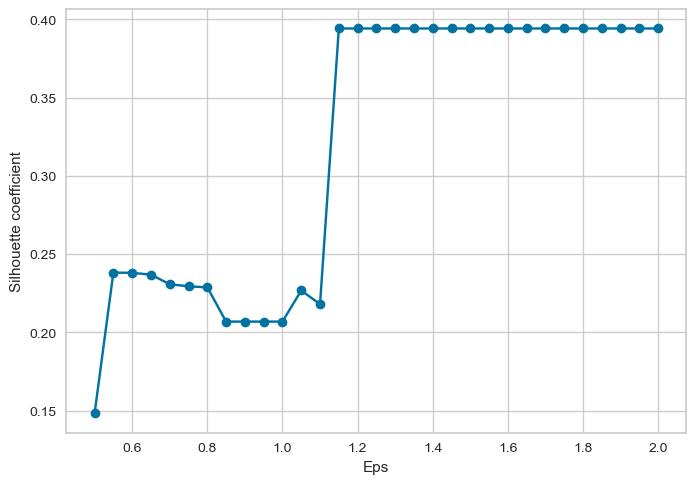

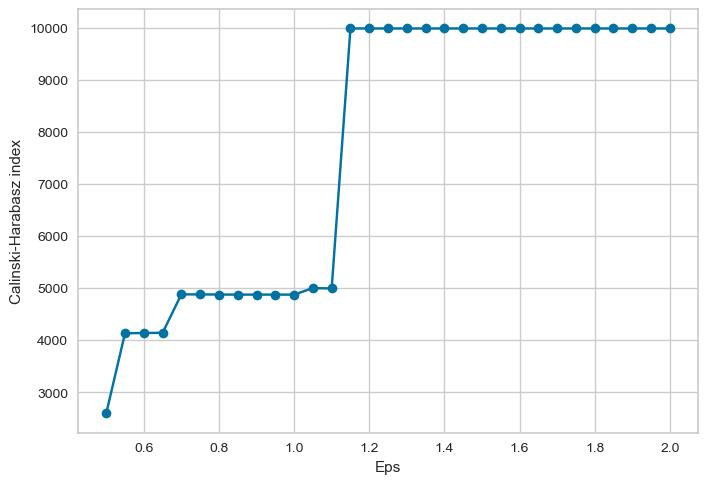

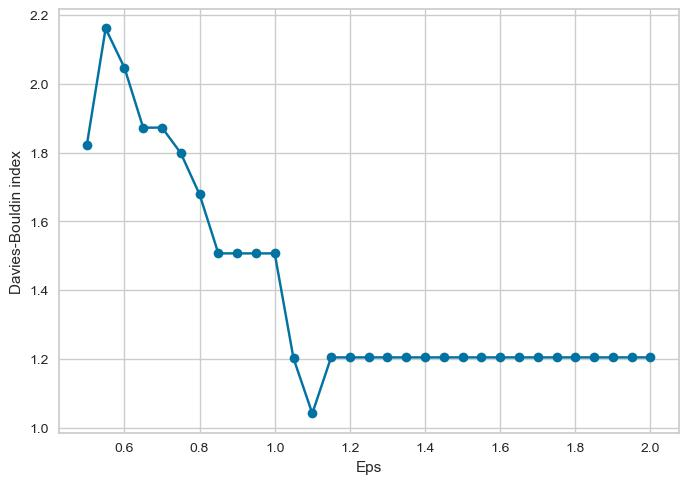

In [87]:
def plot_scores_from_values_dbscan(indexes, score_tuples, ylabel):
    _, scores, _ = zip(*score_tuples)
    plt.plot(indexes, scores, marker = 'o')
    plt.xlabel('Eps')
    plt.ylabel(ylabel)
    plt.show()

plot_scores_from_values_dbscan(eps_range, sil_scores, 'Silhouette coefficient')
plot_scores_from_values_dbscan(eps_range, calinski_scores, 'Calinski-Harabasz index')
plot_scores_from_values_dbscan(eps_range, davies_scores, 'Davies-Bouldin index')

## Graphical description of clustered data (DBSCAN)

In [88]:
print_best_coefficients_dbscan('Silhouette', sil_scores)
print_best_coefficients_dbscan('Calinski-Harabasz', calinski_scores)
print_best_coefficients_dbscan('Davies-Bouldin', davies_scores, False)

Max. Silhouette score: 0.394 (clusters: 2, eps.: 1.1500000000000006)
Max. Calinski-Harabasz score: 9986.676 (clusters: 2, eps.: 1.1500000000000006)
Min. Davies-Bouldin score: 1.041 (clusters: 3, eps.: 1.1000000000000005)


Eps.: 1.1


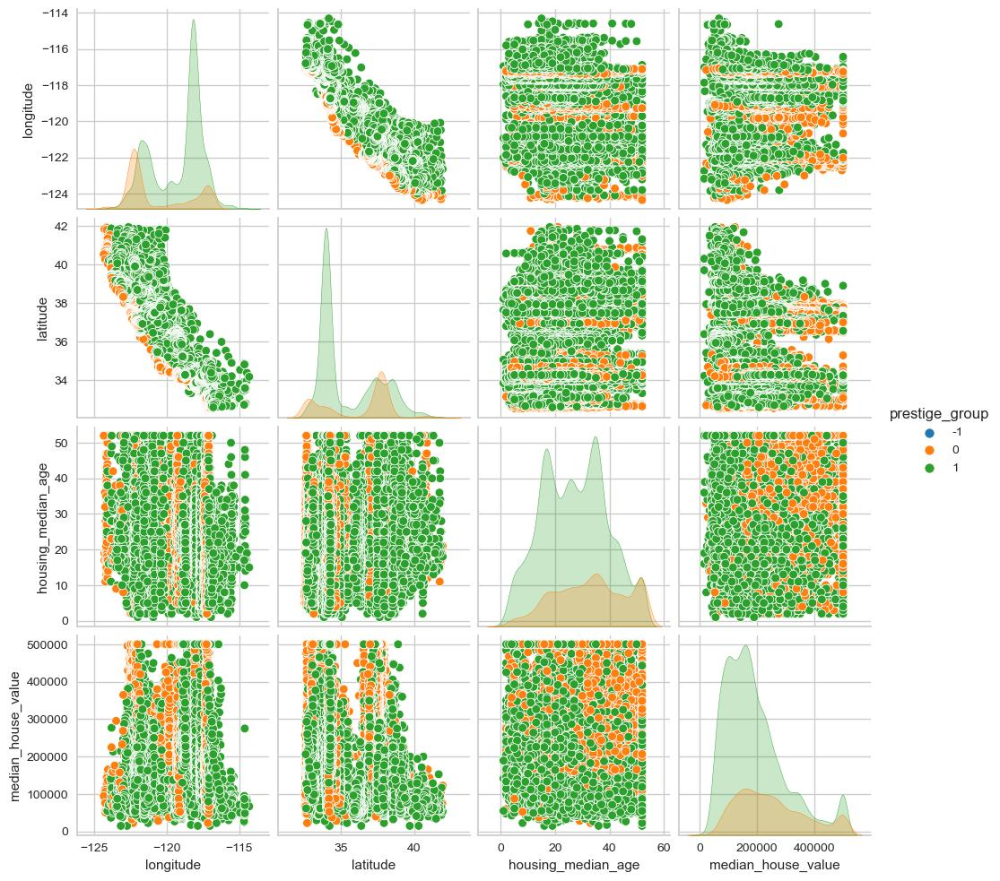

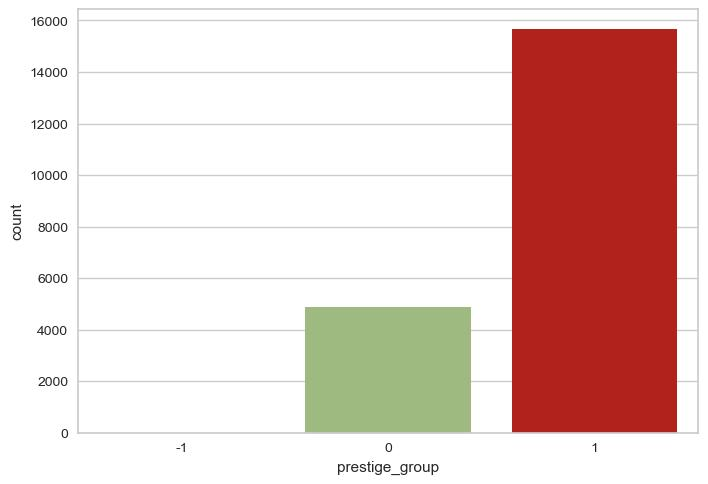

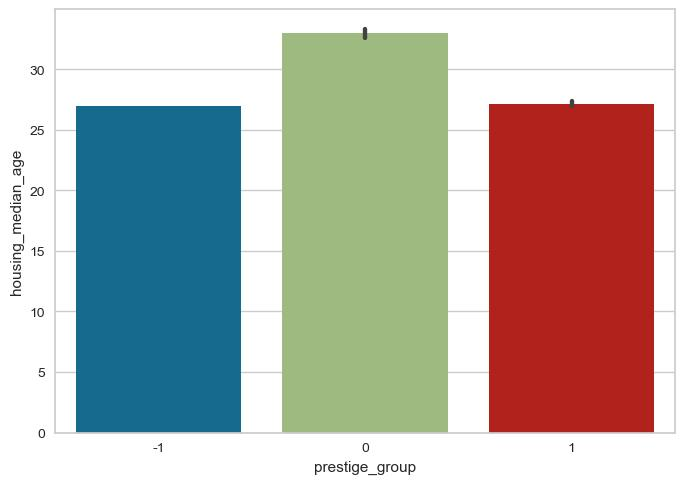

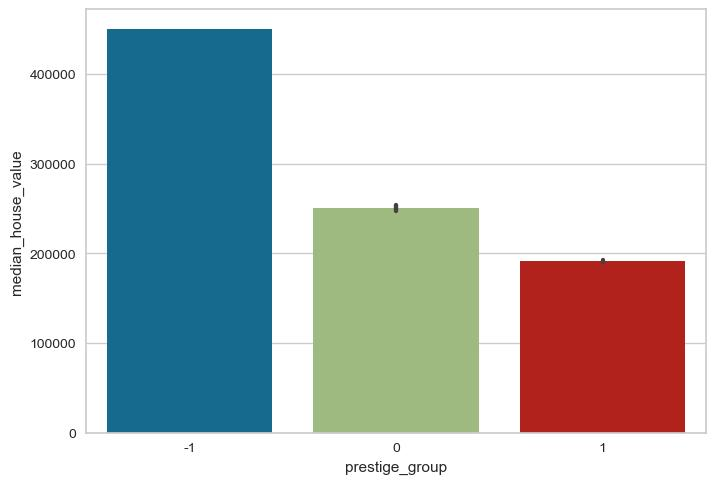


Eps.: 1.15


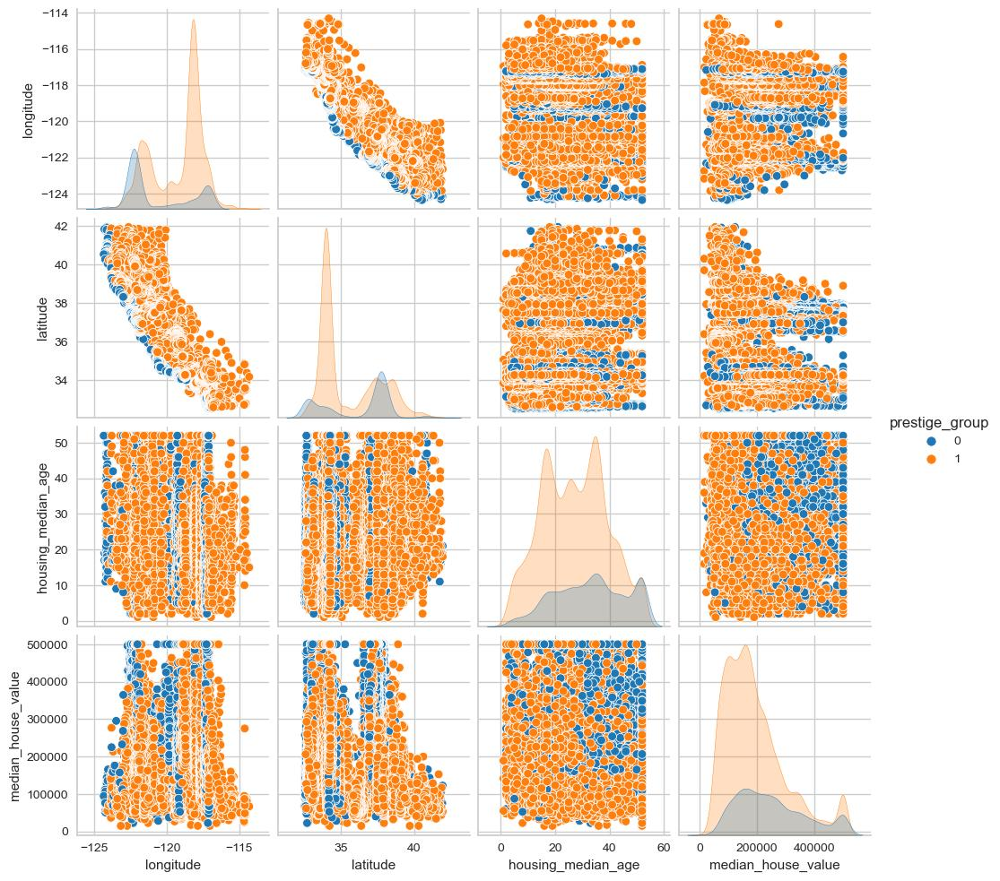

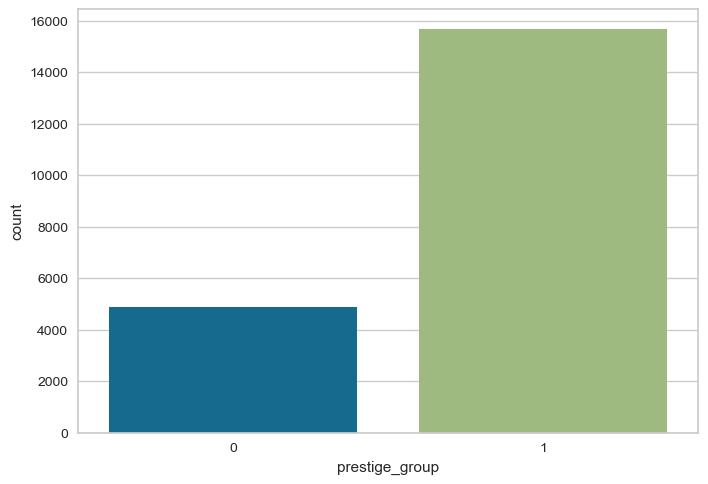

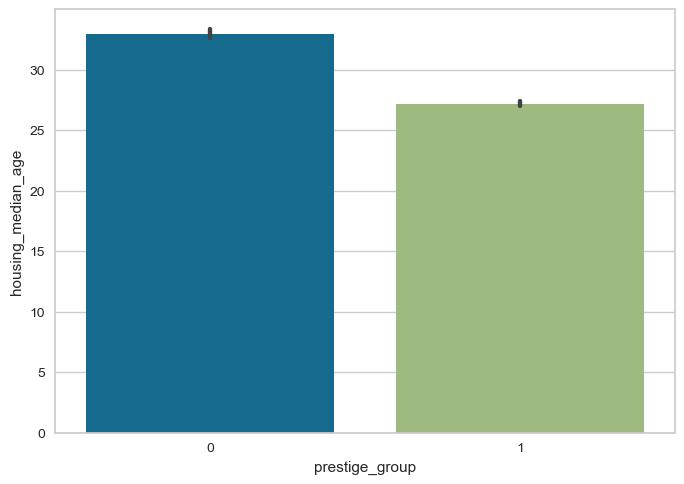

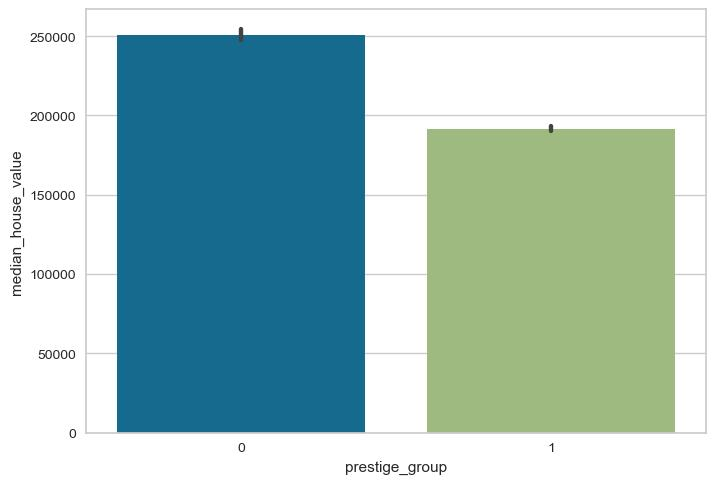

In [92]:
eps_list = sorted([1.15, 1.1])
for eps in eps_list:
    print(f'Eps.: {eps}')
    dbscan = DBSCAN(eps = eps)
    groups = dbscan.fit_predict(X)
    dataset_after_clustering = dataset.copy()
    dataset_after_clustering['prestige_group'] = groups
    describe_clustered_data(dataset_after_clustering)
    print('')